In [1]:
import numpy as np
import pandas as pd
import netCDF4 as nc
import os
import re
import glob
import rasterio
import xarray as xr
import geopandas as gpd
import requests
from datetime import datetime, timedelta
import copy
import geopandas as gpd

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap,BoundaryNorm
import matplotlib.cm as cm
import imageio
import pygeodesy
from pygeodesy.ellipsoidalKarney import LatLon
import folium
from shapely.geometry import Point,Polygon
from folium.plugins import FastMarkerCluster
import matplotlib.patches as mpatches

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.ticker as mticker
from cartopy.io import shapereader
from sklearn.metrics import mean_squared_error
import matplotlib.colors as mcolors
from scipy.spatial.distance import cdist
from itertools import combinations
from matplotlib.colors import to_rgb
import seaborn as sns

import csv
from scipy import stats

In [2]:
path_raster = '/work/a06/yingying/SWOT/save/'
rasterpoint_path = '/work/a06/yingying/SWOT/raster/'
path_riverRP = '/work/a06/yingying/SWOT/riverRP/SWOT_PRIOR_RIVER_DATABASE/'
path_swot = '/work/a06/yingying/SWOT/'
path1 = '/work/a06/yingying/SWOT/save_region1/' # hokkaido
path2 = '/work/a06/yingying/SWOT/save_region2/' # kanto
raster_file_path = '/work/a06/yingying/SWOT/raster/100/'
meta_path= '/work/a06/yingying/SWOT/gauge/'
data_all = np.load(path_raster+'swot_gauges.npy')
# data[station_num,filelen]
wse    = data_all[:,0,:]
quawse = data_all[:,1,:]
quaarea= data_all[:,2,:]
quasig = data_all[:,3,:]
npix   = data_all[:,4,:]
obs    = data_all[:,5,:]
obs = np.where(obs<-999,np.nan,obs)

In [3]:
# lat_min,lat_max,lon_min,lon_max = 30,46,128,149
# read raster data, only keep good quality flag data
def def_range(lat_ind,glat):
    lat_range = [31,32,33,34,35,36,38,41,42,43,44,45,46]
    if glat-lat_range[int(lat_ind)]>0:
        lat_ind_new = int(lat_ind) + 1
    else:
        lat_ind_new = int(lat_ind)
    if lat_ind_new <=1:
        lat_min,lat_max,lon_min,lon_max = 31,32,130,132
    if lat_ind_new == 2:
        lat_min,lat_max,lon_min,lon_max = 32,33,129,133
    if lat_ind_new == 3:
        lat_min,lat_max,lon_min,lon_max = 33,34,129,137
    if lat_ind_new == 4:
        lat_min,lat_max,lon_min,lon_max = 34,35,130,139
    if lat_ind_new == 5:
        lat_min,lat_max,lon_min,lon_max = 35,36,132,141
    if lat_ind_new == 6:
        lat_min,lat_max,lon_min,lon_max = 36,38,136,141
    if lat_ind_new == 7:
        lat_min,lat_max,lon_min,lon_max = 38,41,139,142
    if lat_ind_new ==8:
        lat_min,lat_max,lon_min,lon_max = 41,42,140,142
    if lat_ind_new ==9:
        lat_min,lat_max,lon_min,lon_max = 42,43,139,145
    if lat_ind_new ==10:
        lat_min,lat_max,lon_min,lon_max = 43,44,140,146
    if lat_ind_new ==11:
        lat_min,lat_max,lon_min,lon_max = 44,45,141,146
    if lat_ind_new >=12:
        lat_min,lat_max,lon_min,lon_max = 45,46,141,143
    return lat_min,lat_max,lon_min,lon_max,lat_ind_new

def JP_range(glon_min,glon_max,glat_min,glat_max):
    lat_range = [31,32,33,34,35,36,38,41,42,43,44,45,46]
    latmin_ind = np.argmin(np.abs(lat_range-glat_min))
    latmax_ind = np.argmin(np.abs(lat_range-glat_max))
    lat_min1,lat_max1,lon_min1,lon_max1,latmin_ind_new = def_range(latmin_ind,glat_min)
    lat_min2,lat_max2,lon_min2,lon_max2,latmax_ind_new = def_range(latmax_ind,glat_max)
    if latmin_ind_new!=latmax_ind_new:
        lat_min = min(lat_min1,lat_min2)
        lat_max = max(lat_max1,lat_max2)
        lon_min = min(lon_min1,lon_min2)
        lon_max = max(lon_max1,lon_max2)
    else:
        lat_min = lat_min1
        lat_max = lat_max1
        lon_min = lon_min1
        lon_max = lon_max1
    return lat_min,lat_max,lon_min,lon_max

def read_raster_nc(filename): 
    # Read each file using netCDF4
    filepath = raster_file_path + filename  
    try:
        nf = nc.Dataset(filepath,'r')
        glon_min= nf.getncattr('geospatial_lon_min')
        glon_max= nf.getncattr('geospatial_lon_max')
        glat_min= nf.getncattr('geospatial_lat_min')
        glat_max= nf.getncattr('geospatial_lat_max') 
        # reduce reading range
        lat_min,lat_max,lon_min,lon_max = JP_range(glon_min,glon_max,glat_min,glat_max)
        if (glon_min>lon_max) | (glon_max<lon_min) | (glat_min>lat_max) | (glat_max<lat_min):
            return [-999],None,None,None,None,None,None 
        else:
            print('raster2',glon_min,glon_max,glat_min,glat_max)
            print('range2',lon_min,lon_max,lat_min,lat_max)
            lat = np.array(nf.variables['latitude'])
            lon = np.array(nf.variables['longitude'])
            wse = np.array(nf.variables['wse'])
            quawse = np.array(nf.variables['wse_qual_bitwise'])
            quaarea= np.array(nf.variables['water_area_qual_bitwise'])
            quasig = np.array(nf.variables['sig0_qual_bitwise'])
            bscatter = np.array(nf.variables['sig0'])
            # bas_all = np.array(nf.variables[''])
            lon = np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,lon)
            lat = np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,lat)
            wse = np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,wse)
            quawse = np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,quawse)
            quaarea= np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,quaarea)
            quasig = np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,quasig)
            bscatter = np.where((quawse>2*10**4)|(quaarea>2*10**4)|(quasig>2*10**4)|(quawse<0)|(quaarea<0)|(quasig<0),np.nan,bscatter)
            # bas_all = np.where(quawse_all>10**8,np.nan,bas_all)
            return lat,lon,wse,quawse,quaarea,quasig,bscatter
    except Exception as e:
        print(f"Error reading {filepath}: {e}")
        return [-999],None,None,None,None,None,None


In [4]:
flag_types_all = np.load(path_swot+'jupyter/flag_type.npy')
flag_types = flag_types_all[(flag_types_all<3*10**4)&(flag_types_all>=0)]

def find_highfre_flag(counts,quawse,quaarea,quasig):
    flag_fre   = np.zeros(np.shape(flag_types))
    for count in range(0,counts):
        if ((quawse[count]==quaarea[count])&(quawse[count]==quasig[count])&(quasig[count]==quaarea[count])) | (quasig[count]==7) | (quaarea[count]== 8|10|12|14) | ((quaarea[count]>=256)&(quaarea[count]<10**3)&(quaarea[count]==quasig[count])):
            flag_ind = np.where(flag_types==quawse[count])[0]
            if np.shape(flag_ind)[0]<1:
                continue
            else:
                flag_fre[int(flag_ind)] = flag_fre[int(flag_ind)] + 1
        else:
            continue
    if np.shape(np.unique(flag_fre))[0]<2:
        return np.nan
    else:
        flag_point = np.argmax(flag_fre)
        return flag_point
            
def define_flag_map(counts,quawse,quaarea,quasig):
    flag_all = np.zeros((np.shape(quawse)[1],np.shape(quawse)[2]))
    for row in range(0,np.shape(quawse)[1]):
        if np.all(np.isnan(quawse[:,row,:])):
            continue
        for col in range(0,np.shape(quawse)[2]):
            if np.all(np.isnan(quawse[:,row,col])):
                continue
            flag_all[row,col] = find_highfre_flag(counts,quawse[:,row,col],quaarea[:,row,col],quasig[:,row,col])
    return flag_all
    

In [5]:
#%% read all raster data for a cycle
def find_cycle():
    file_all = []
    file_loc = []
    # filenames = []
    locs = []
    for root, dirs, files in os.walk(raster_file_path):
        for file in files:
            if file.endswith(".nc"):
                locs.append(file[42:45]+file[46:49])
                file_all.append(file)
                file_loc.append(int(file[42:45]+file[46:49]))
    loc_uni = np.unique(np.array(locs,dtype=np.int32))
    file_loc = np.array(file_loc,dtype=np.int32)
    return file_all,file_loc,loc_uni
region_all, file_loc, loc_uni = find_cycle()

def find_loc_image():
    # find image in the region
    lat_point = list()
    lon_point = list()
    wse_point = list()
    wse_wet_point = list()
    wse_dry_point = list()
    flag_point = list()
    bs_point = list()
    loc_count = 0
    for loc in loc_uni:
        loc_num  = np.int32(loc)
        file_ind = np.where(file_loc==loc_num)[0]
        if np.shape(file_ind)[0] == 0:
            continue
        file_ind = np.array(file_ind,dtype=np.int32)
        lat_all  = list()
        lon_all  = list()
        wse_all  = list()
        wse_wet  = list()
        wse_dry  = list()
        quawse_all  = list()
        quaarea_all = list()
        quasig_all  = list()
        bscatter_all  = list()
        # read file image in different location
        counts = 0
        for file_read_ind in file_ind:
            file_read = region_all[int(file_read_ind)]
            lat,lon,wse,quawse,quaarea,quasig,bscatter = read_raster_nc(file_read)
            if np.array_equal(lat, np.array([-999])):
                break
            file_time = file_read[55:57]
            # wet period
            if '06' in file_time or '07' in file_time or '08' in file_time:
                wse_wet = wse_wet + [wse]
            if '12' in file_time or '01' in file_time or '02' in file_time:
                wse_dry = wse_dry + [wse]
            counts  = counts + 1
            lat_all = lat_all + [lat]
            lon_all = lon_all + [lon]
            wse_all = wse_all + [wse]
            quawse_all = quawse_all + [quawse]
            quaarea_all = quaarea_all + [quaarea]
            quasig_all = quasig_all + [quasig]
            bscatter_all = bscatter_all + [bscatter]
        if counts==0:
            continue
        loc_count = loc_count + 1
        lat_mean = np.nanmean(np.array(lat_all),axis=0)
        lat_filter = lat_mean[~np.isnan(lat_mean)]
        lon_mean = np.nanmean(np.array(lon_all),axis=0)
        lon_filter = lon_mean[~np.isnan(lat_mean)]
        wse_mean = np.nanmean(np.array(wse_all),axis=0)
        wse_filter = wse_mean[~np.isnan(lat_mean)]
        bs_mean  = np.nanmean(np.array(bscatter_all),axis=0)
        bs_filter = bs_mean[~np.isnan(lat_mean)]
        # calculate the high frequency flag
        flag_def = define_flag_map(counts,np.array(quawse_all),np.array(quaarea_all),np.array(quasig_all))
        flag_filter = flag_def[~np.isnan(lat_mean)] 
        
        lat_point.extend(lat_filter[~np.isnan(flag_filter)])
        lon_point.extend(lon_filter[~np.isnan(flag_filter)])
        wse_point.extend(wse_filter[~np.isnan(flag_filter)])
        if np.shape(wse_wet)[0]!=0:
            wse_wet_mean = np.nanmean(np.array(wse_wet),axis=0)
            wse_wet_filter = wse_wet_mean[~np.isnan(lat_mean)]
            wse_wet_point.extend(wse_wet_filter[~np.isnan(flag_filter)])
        else:
            wse_wet_filter = np.full(np.shape(wse_filter[~np.isnan(flag_filter)])[0],np.nan)
            wse_wet_point.extend(wse_wet_filter)
        if np.shape(wse_dry)[0]!=0:
            wse_dry_mean = np.nanmean(np.array(wse_dry),axis=0)
            wse_dry_filter = wse_dry_mean[~np.isnan(lat_mean)]
            wse_dry_point.extend(wse_dry_filter[~np.isnan(flag_filter)])
        else:
            wse_dry_filter = np.full(np.shape(wse_filter[~np.isnan(flag_filter)])[0],np.nan)
            wse_dry_point.extend(wse_dry_filter)
        flag_point.extend(flag_filter[~np.isnan(flag_filter)])
        bs_point.extend(bs_filter[~np.isnan(flag_filter)])
        # if loc_count>0:
        #     break
        print(np.shape(flag_point))
    return lat_point,lon_point,wse_point,wse_wet_point,wse_dry_point,flag_point,bs_point
# lat_point,lon_point,wse_point,wse_wet_point,wse_dry_point,flag_point,bs_point = find_loc_image()


In [6]:
rasterpoint_path = '/work/a06/yingying/SWOT/raster/'
lat_point = np.load(rasterpoint_path+'lat_point.npy')
lon_point = np.load(rasterpoint_path+'lon_point.npy')
wse_point = np.load(rasterpoint_path+'wse_point.npy')
flag_point = np.load(rasterpoint_path+'flag_point.npy')
sig_point = np.load(rasterpoint_path+'sig_point.npy')
sig_point = np.where(np.array(sig_point)>10**7,np.nan,sig_point)
qual_point = np.load(rasterpoint_path+'qual_point.npy')
up_point = np.load(rasterpoint_path+'up_point.npy')
wid_point = np.load(rasterpoint_path+'wid_point.npy')
flow_point = np.load(rasterpoint_path+'flow_point.npy')
wse_wet_point = np.load(rasterpoint_path+'wse_wet_point.npy')
wse_dry_point = np.load(rasterpoint_path+'wse_dry_point.npy')

MAD_point = np.load(rasterpoint_path+'MAD_point.npy')
MAD_new_point = np.load(rasterpoint_path+'MAD_new_point.npy')
flag_count  = np.load(rasterpoint_path+'flag_count.npy')
wse_new_MAD = np.load(rasterpoint_path+'wse_new_MAD.npy') # wse_new: after filtering
wse_new_flag = np.load(rasterpoint_path+'wse_new_flag.npy') # wse_new: after filtering

remake_MAD  = np.load(rasterpoint_path+'remake_MAD_filter.npy')

In [7]:
# obs ref
df  = pd.read_csv("/work/a06/yingying/SWOT/gauge/MLIT_FlowGauge_new_info.csv")
site_name = np.array(df.iloc[:,0].values)
ref = np.array(df.iloc[:,1].values)
ref = np.where(ref==999,np.nan,ref)
# # call situ reference height
path_alloc   = '/work/a06/yingying/obs/alloc/'
name_alloc   = 'wlv_2019h.xlsx'
file_path = path_alloc+name_alloc
df = pd.read_excel(file_path)
id_info =  np.array(df.iloc[:,0])
lat_situ =  np.array(df.iloc[:,1])
lon_situ =  np.array(df.iloc[:,2])
ix     = np.array(df.iloc[:,8])-1
iy     = np.array(df.iloc[:,9])-1
ref_situ = np.full((len(id_info)),np.nan)
for situ in range(0,len(id_info)):
    where_ref= np.where(site_name == id_info[situ])[0]
    ref_situ[situ] = ref[where_ref[0]]
ref_situ = np.where(ref_situ>998.9,np.nan,ref_situ)
elv2023_path = '/work/a06/yingying/obs/2023UST/wlv/'
elv2024_path = '/work/a06/yingying/obs/2024UST/wlv/'
def read_bin(path,name):
    with open(path+name,'rb') as f:
        data_all = np.fromfile(f, dtype=np.float32)
        f.close()
    return data_all
elv_all = np.full((np.shape(wse)[0],2),np.nan)
elv_all[:,0] = read_bin(elv2023_path,'elv_situ2023.bin')
elv_all[:,1] = read_bin(elv2024_path,'elv_situ2024.bin')
elv_situ = np.nanmean(elv_all,axis=1)

# wse ref
path_software = "/work/a06/yingying/SWOT/geoids/"
ginterpolator = pygeodesy.GeoidKarney(path_software+"egm2008-5.pgm")
wse_ref = np.full((np.shape(wse)[0]),np.nan)
for i in range(0,np.shape(wse)[0]):
    latlon = LatLon(lat_situ[i],lon_situ[i])
    wse_ref[i] = ginterpolator(latlon)

/tmp/ipykernel_340083/2879844299.py:31: RuntimeWarning: Mean of empty slice
  elv_situ = np.nanmean(elv_all,axis=1)


In [8]:
#%% read river flow data
# 1: east, 2: southeast, 4: south, 8: southwest, 16: west, 32: northwest, 64: north. 128: northeast 0: river mouth, -1: inland depression, -9: undefined (ocean)
lat_min,lat_max,lon_min,lon_max = 30,46,128,149
def read_tif(filename):
    up_area  = np.zeros(((lat_max-lat_min)*3600,(lon_max-lon_min)*3600))
    lon2d= np.zeros(((lat_max-lat_min)*3600,(lon_max-lon_min)*3600))
    lat2d= np.zeros(((lat_max-lat_min)*3600,(lon_max-lon_min)*3600))
    filepath = '/work/a06/yingying/SWOT/map/'+filename
    tiff_files = glob.glob(os.path.join(filepath, '*.tif'))
    for filenum in range(0,len(tiff_files)):
        filen = tiff_files[filenum]
        file_lon = int(filen[36:39])
        file_lat = int(filen[33:35])
        if (file_lat-lat_min>=0) &(file_lon-lon_min>=0):           
            with rasterio.open(filen) as dataset:
                tiff_data = dataset.read(1)
                up_area[(file_lat-lat_min)*3600:(file_lat-lat_min+1)*3600,(file_lon-lon_min)*3600:(file_lon-lon_min+1)*3600] = tiff_data
                # transform = dataset.transform
                # height, width = dataset.height, dataset.width
                # lon, lat = rasterio.transform.xy(transform, range(height), range(width), offset='center')
                # lon2d[(file_lat-lat_min)*3600:(file_lat-lat_min+1)*3600,(file_lon-lon_min)*3600:(file_lon-lon_min+1)*3600], lat2d[(file_lat-lat_min)*3600:(file_lat-lat_min+1)*3600,(file_lon-lon_min)*3600:(file_lon-lon_min+1)*3600] = np.meshgrid(lon, lat)
    return up_area #, lon2d, lat2d, 
# wid_all = read_tif('wth')
# flowdir_all = read_tif('dir')
# uparea_all = read_tif('upa')

def read_plot_tif(filename):
    up_area  = np.zeros(((lat_max-lat_min)*3600,(lon_max-lon_min)*3600)) 
    lat_all  = np.zeros((lat_max-lat_min)*3600) 
    lon_all  = np.zeros((lon_max-lon_min)*3600)
    filepath = '/work/a06/yingying/SWOT/map/'+filename
    tiff_files = glob.glob(os.path.join(filepath, '*.tif'))
    for filenum in range(0,len(tiff_files)):
        filen = tiff_files[filenum]
        file_lon = int(filen[36:39])
        file_lat = int(filen[33:35])
        if (file_lat-lat_min>=0) &(file_lon-lon_min>=0):   
            with rasterio.open(filen) as dataset:
                tiff_data = dataset.read(1)
                # be care !! when drawing the figure should convert latitude tiff[::-1,:]
                up_area[(file_lat-lat_min)*3600:(file_lat-lat_min+1)*3600,(file_lon-lon_min)*3600:(file_lon-lon_min+1)*3600] = tiff_data[::-1,:]
    return up_area
up_plot = read_plot_tif('upa')
flow_plot= read_plot_tif('dir')
wid_plot = read_plot_tif('wth')



In [9]:
# match map resolution with Raster (100m)
#%% setting of figure
lon_all_map = np.linspace(lon_min,lon_max,int((lon_max-lon_min)*3600))
lat_all_map = np.linspace(lat_min,lat_max,int((lat_max-lat_min)*3600))
def match_uparea():
    up_grid = np.full(np.shape(lat_point)[0],np.nan)
    wid_grid = np.full(np.shape(lat_point)[0],np.nan)
    flow_grid = np.full(np.shape(lat_point)[0],np.nan)
    qual_grid = np.full(np.shape(lat_point)[0],np.nan)
    for point in range(0,np.shape(lat_point)[0]):
        lat_grid = lat_point[point]
        lon_grid = lon_point[point]
        lat_ind = np.argmin(np.abs(lat_all_map-lat_grid))
        lon_ind = np.argmin(np.abs(lon_all_map-lon_grid))
        up_grid[point] = up_plot[lat_ind,lon_ind]
        wid_grid[point]= wid_all[lat_ind,lon_ind]
        # flow_grid[point] = flowdir_all[lat_ind,lon_ind]
        qual_grid[point] = flag_types[int(flag_point[point])]
    up_grid = np.where(up_grid<0,np.nan,up_grid)
    return up_grid,wid_grid,flow_grid,qual_grid
# up_grid,wid_grid,flow_grid,qual_grid  = match_uparea()

def match_obs_uparea():
    up_grid = np.full(np.shape(lat_situ)[0],np.nan)
    wid_grid = np.full(np.shape(lat_situ)[0],np.nan)
    flow_grid = np.full(np.shape(lat_situ)[0],np.nan)
    qual_grid = np.full(np.shape(lat_situ)[0],np.nan)
    for point in range(0,np.shape(lat_situ)[0]):
        lat_grid = lat_situ[point]
        lon_grid = lon_situ[point]
        lat_ind = np.argmin(np.abs(lat_all_map-lat_grid))
        lon_ind = np.argmin(np.abs(lon_all_map-lon_grid))
        up_grid[point] = up_plot[lat_ind,lon_ind]
        wid_grid[point]= wid_plot[lat_ind,lon_ind]
        flow_grid[point] = flow_plot[lat_ind,lon_ind]
    up_grid = np.where(up_grid<0,np.nan,up_grid)
    return up_grid,wid_grid,flow_grid
up_obs,wid_obs,flow_obs  = match_obs_uparea()

In [10]:
#%% read Japan map
def read_Japan_tiff():
    file = '/work/a06/yingying/SWOT/map/elv/el.tif'
    with rasterio.open(file) as dataset:
        bounds = dataset.bounds
        print(bounds)
        tiff_data = dataset.read(1)
    tif = tiff_data[::-1,:]
    return tif
elv = read_Japan_tiff()

BoundingBox(left=119.99999898253009, bottom=19.99999884935096, right=154.99166747415438, top=50.000000413972884)


In [11]:
#%% lower resolution
size=120
uparea_filter = np.where(up_plot<10**2,np.nan,up_plot)
def low_resolution(var,size):
    var_low = np.full((int((lat_max-lat_min)*3600/size),int((lon_max-lon_min)*3600/size)),np.nan)
    for row in range(0,np.shape(var_low)[0]):
        if (np.all(np.isnan(var[row*size:(row+1)*size,:]))==1):
            continue
        for col in range(0,np.shape(var_low)[1]):
            var_low[row,col] = np.nanmean(var[row*size:(row+1)*size,col*size:(col+1)*size])
    return var_low    
up_low = low_resolution(uparea_filter,size) # for figure ploting
lon_map_low = np.linspace(lon_min,lon_max,int((lon_max-lon_min)*3600/size))
lat_map_low = np.linspace(lat_min,lat_max,int((lat_max-lat_min)*3600/size))
lon2d_low_map, lat2d_low_map = np.meshgrid(lon_map_low, lat_map_low)


/tmp/ipykernel_340083/1851479521.py:10: RuntimeWarning: Mean of empty slice
  var_low[row,col] = np.nanmean(var[row*size:(row+1)*size,col*size:(col+1)*size])


In [12]:
def read_test():
    path = '/work/a06/yingying/SWOT/raster/region_Tone/'
    filename = 'SWOT_L2_HR_Raster_100m_UTM54S_N_x_x_x_010_532_046F_20240212T235256_20240212T235317_PIC0_01.nc'
    nf = nc.Dataset(path+filename,'r')
    lat_all = np.array(nf.variables['latitude'])
    lon_all = np.array(nf.variables['longitude'])
    wse_all = np.array(nf.variables['wse'])
    lon_all = np.where(wse_all>10**8,np.nan,lon_all)
    lat_all = np.where(wse_all>10**8,np.nan,lat_all)
    wse_all = np.where(wse_all>10**8,np.nan,wse_all)
    return lat_all,lon_all,wse_all
lat_all,lon_all,wse_all = read_test()

def draw_region():
    fig = plt.figure(dpi = 600,figsize=(7.5,4.5))
    ax1 = fig.add_axes([0.1,0.1,0.8,0.8],projection=ccrs.PlateCarree())
    ax1.set_axis_off()
    ax1.set_extent([140,141,35.7,36], ccrs.PlateCarree())
    gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0, linestyle='-.')
    ax1.coastlines(alpha=1.,linestyle='-',color = "#3F3A3A",lw=0.8,resolution='10m')
    con_plot1 = ax1.scatter(lon_all,lat_all,s=0.0001,zorder=3,cmap='black',transform=ccrs.PlateCarree()) 
# draw_region()

In [13]:
# Figure8: Raster map
font_label = {'family': 'serif', 'weight': 'normal', 'size': 14}
font_biglabel = {'family': 'serif', 'weight': 'normal', 'size': 18}
def draw_Japan(cbtitle,lon_plot,lat_plot,var,savefig,vmin,vmax,s):
    fig = plt.figure(dpi = 600,figsize=(7.5,4.5))
    ax1 = fig.add_axes([0.1,0.1,0.8,0.8],projection=ccrs.PlateCarree())
    ax1.set_axis_off()
    ax1.set_extent([lon_min,lon_max,lat_min,lat_max], ccrs.PlateCarree())
    gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0, linestyle='-.')
    ax1.coastlines(alpha=1.,linestyle='-',color = "#3F3A3A",lw=0.5,resolution='10m',zorder=4)

    # mask the other place
    region_lon1 = [128.06, 128.06,138, 138 ]
    region_lat1 = [41 , 45.95 , 45.95, 41  ]
    region_lon2 = [128.06,128.06,131.4,131.4 ]
    region_lat2 = [34.5,41,41,34.5]
    ax1.fill(region_lon1, region_lat1, color='white', transform=ccrs.PlateCarree(), zorder=10)
    ax1.fill(region_lon2, region_lat2, color='white', transform=ccrs.PlateCarree(), zorder=10)
    
    gl.top_labels   = False
    gl.right_labels = False
    gl.bottom_labels   = False
    gl.left_labels = False
    con_plot1 = ax1.scatter(lon_plot,lat_plot,s=s,c=var,zorder=3,cmap='rainbow',transform=ccrs.PlateCarree(),alpha=0.8,vmin=vmin,vmax=vmax) 

    def color_bar(l,b,w,h):
      rect = [l,b,w,h]
      cbar_ax = fig.add_axes(rect)
      return cbar_ax
    [l2,b2,w2,h2] = [0.28,0.52,0.01,0.25]
    cbar_ax2 = color_bar(l2,b2,w2,h2)
    cb2 = plt.colorbar(con_plot1, cax=cbar_ax2,orientation="vertical",shrink=0.5)
    cb2.ax.set_title(cbtitle,fontdict=font_label)
    # ax1.set_title(title,fontdict=font_label)
    plt.show()
    # plt.savefig('/work/a06/yingying/swot/plot/8_Raster_'+savefig+'.jpg', format='jpg',dpi=600)
    plt.close()

# draw_Japan('Quality Flag',lon_point[::20],lat_point[::20],qual_point[::20],'qual',0,21000,0.0001)
# draw_Japan('WSE (m)',lon_point[::20],lat_point[::20],wse_point[::20],'wse',-5,350,0.0001)
# draw_Japan('Sigma',lon_point[::20],lat_point[::20],sig_point[::20],'sig',0,120,0.001)


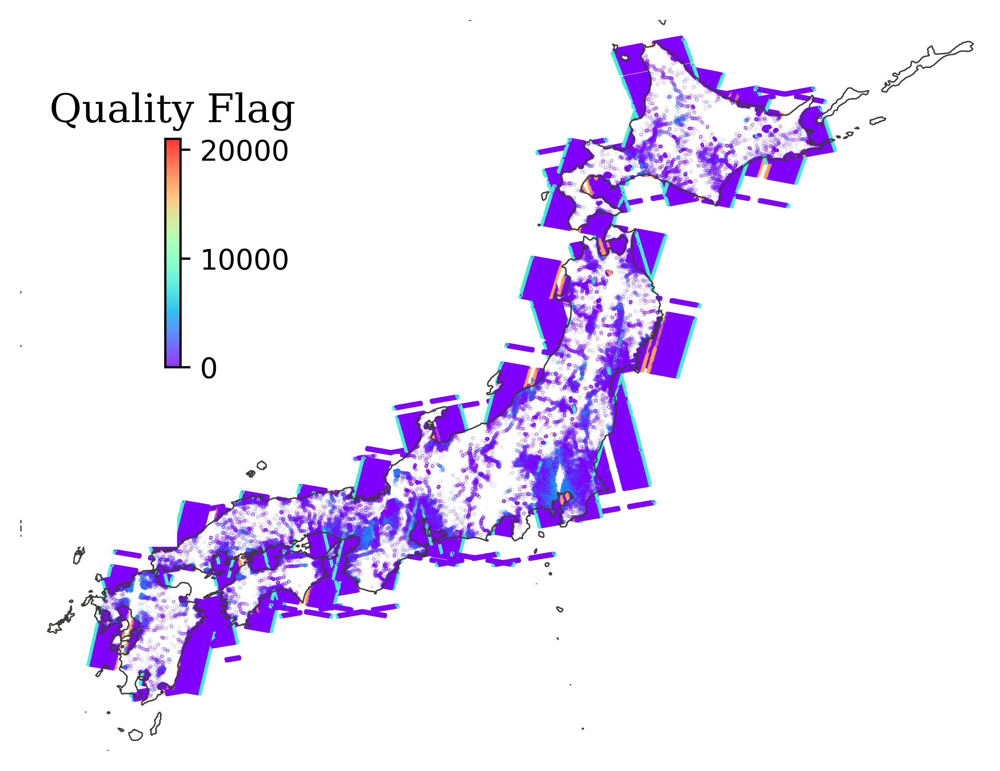

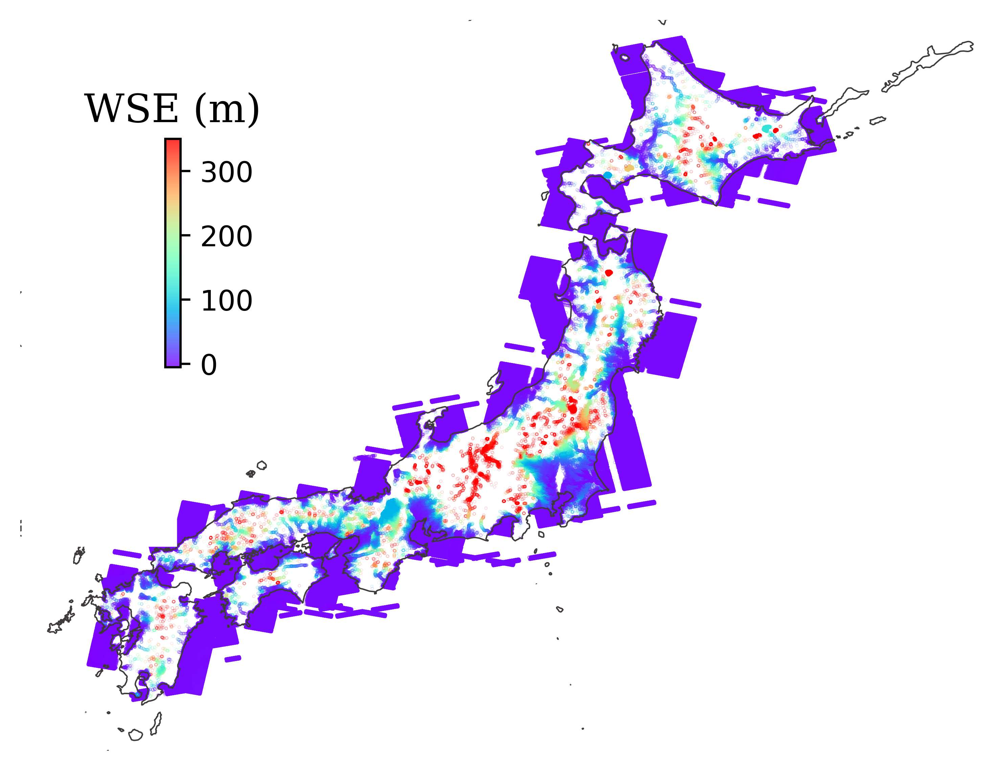

In [14]:
# use sig to exclude land pixel
wse_point = np.where(np.isnan(sig_point),np.nan,wse_point)
qual_point = np.where(np.isnan(sig_point),np.nan,qual_point)
draw_Japan('Quality Flag',lon_point[::10],lat_point[::10],qual_point[::10],'qual_filter',0,21000,0.001)
draw_Japan('WSE (m)',lon_point[::10],lat_point[::10],wse_point[::10],'wse_filter',-5,350,0.001)

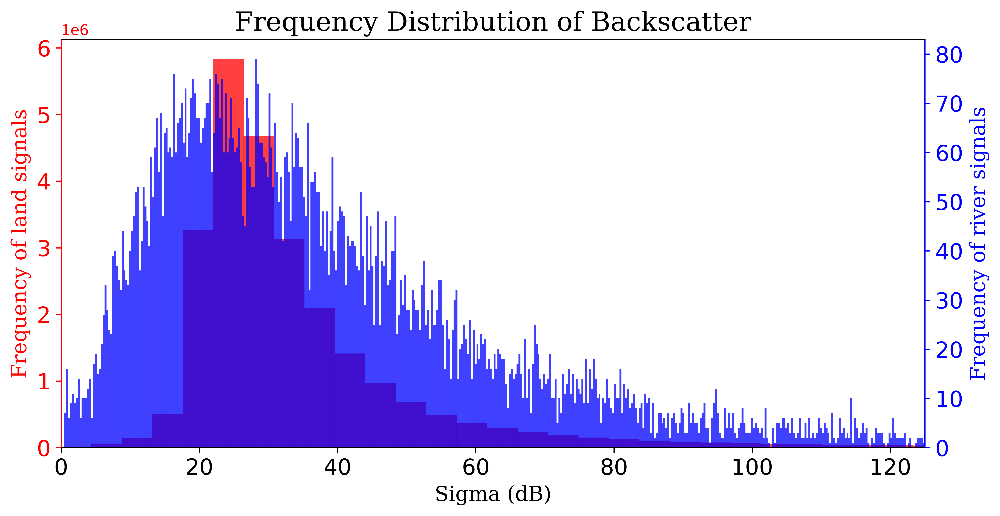

In [15]:
#%% plot hist
font_title = {'family': 'serif', 'weight': 'normal', 'size': 18}
def plot_hist(var_flat,var_flat0):
    fig,ax1 = plt.subplots(dpi=600,figsize=(10.5,5))
    ax2 = ax1.twinx()
    sns.histplot(var_flat,bins=5000,fill=True,color='red',ax=ax1)
    sns.histplot(var_flat0,bins=5000,fill=True,color='blue',ax=ax2)
    ax1.set_title('Frequency Distribution of Backscatter',fontdict=font_title)
    ax1.set_xlabel('Sigma (dB)',fontdict=font_label)
    ax2.spines['left'].set_color('red')
    ax2.spines['right'].set_color('blue')
    ax1.set_ylabel('Frequency of land signals',fontdict=font_label,color='red')
    ax2.set_ylabel('Frequency of river signals',fontdict=font_label,color='blue')
    # ax1.legend(fontsize=18)
    ax1.set_xlim(0,125)
    ax1.tick_params(axis='x',labelsize=15)
    ax1.tick_params(axis='y',labelsize=15,color='red',labelcolor='red')    
    ax2.tick_params(axis='y',labelsize=15,color='blue',labelcolor='blue') 
    r_patch = mpatches.Patch(color='blue',label='River signals')
    b_patch = mpatches.Patch(color='red',label='Land signals')
    # ax2.legend(handles=[r_patch,b_patch],loc='upper right',frameon=True,fontsize=16)
    plt.savefig('/work/a06/yingying/swot/plot/9_backscatter.jpg', format='jpg',dpi=600)
    plt.show()

# up_point: np.nan -> ocean
sig_inland = np.where(np.isnan(up_point),np.nan,sig_point)

# river signal h_up_area>10**4 & h_up_area!=np.nan
sig_river = np.where((up_point<10**3)|(np.isnan(up_point)),np.nan,sig_point)

# land signal h_up_area==np.nan
sig_land = np.where((up_point>10**3),np.nan,sig_point)
plot_hist(sig_land,sig_river)


<Axes: >

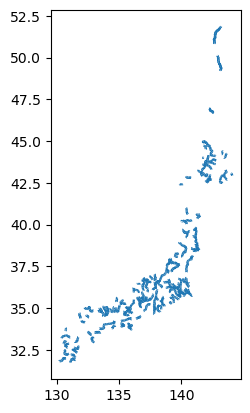

In [16]:
#%% compare with rivers in RiverRP
RP1 = 'as_sword_reaches_hb41_v16.shp'
gdf1 = gpd.read_file(path_riverRP+RP1)
def read_riverRP(gdf):
    coords = gdf.geometry.apply(lambda geom: list(geom.coords) if geom.geom_type == "LineString" else None)
    lons = []
    lats = []
    for line_coords in coords:
        if line_coords:  # If it's not None
            for x, y in line_coords:  # Unpack the tuple
                lons.append(x)
                lats.append(y)
    return lons,lats

lonRP,latRP = read_riverRP(gdf1)
gdf1.plot()

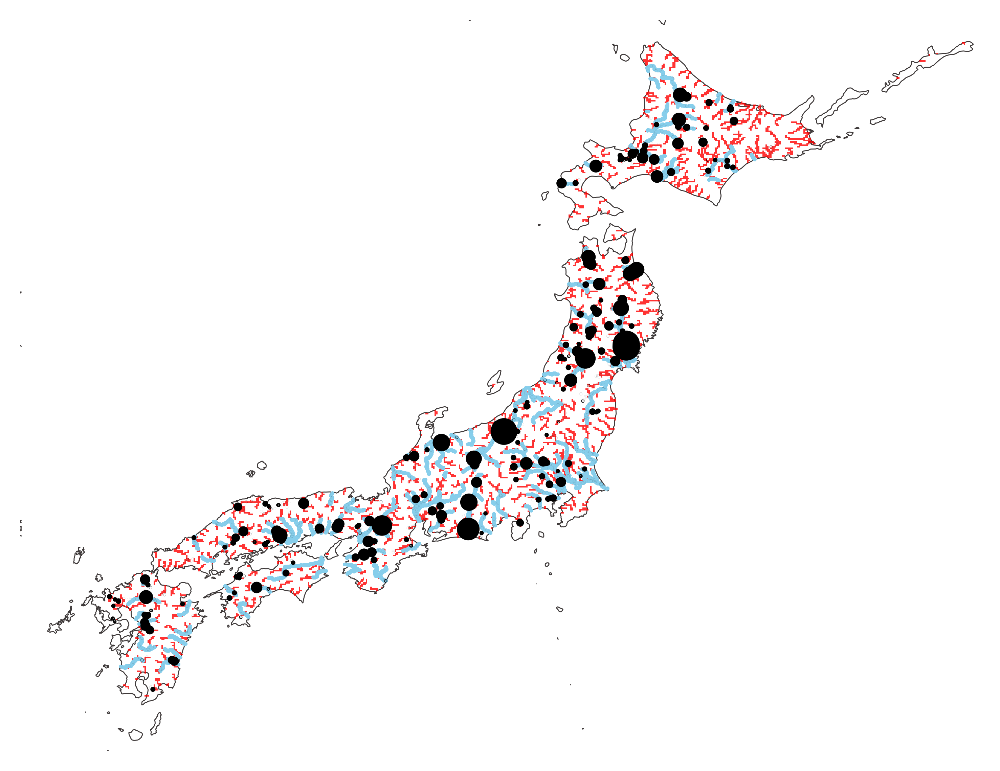

In [17]:
# Figure1: riverRP map
font_label = {'family': 'serif', 'weight': 'normal', 'size': 14}
def draw_JapanRP():
    fig = plt.figure(dpi = 600,figsize=(7.5,4.5))
    ax1 = fig.add_axes([0.1,0.1,0.8,0.8],projection=ccrs.PlateCarree())
    ax1.set_axis_off()
    ax1.set_extent([lon_min,lon_max,lat_min,lat_max], ccrs.PlateCarree())
    gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0, linestyle='-.')
    ax1.coastlines(alpha=1.,linestyle='-',color = "#3F3A3A",lw=0.35,resolution='10m')

    # mask the other place
    region_lon1 = [128.06, 128.06,138, 138 ]
    region_lat1 = [41 , 45.95 , 45.95, 41  ]
    region_lon2 = [128.06,128.06,131.4,131.4 ]
    region_lat2 = [34.5,41,41,34.5]
    ax1.fill(region_lon1, region_lat1, color='white', transform=ccrs.PlateCarree(), zorder=10)
    ax1.fill(region_lon2, region_lat2, color='white', transform=ccrs.PlateCarree(), zorder=10)
    
    gl.top_labels   = False
    gl.right_labels = False
    gl.bottom_labels   = False
    gl.left_labels = False
    cmap_red = ListedColormap(['red']) 
    ax1.scatter(lonRP,latRP,s=0.05,c='skyblue',zorder=3,transform=ccrs.PlateCarree())
    # ax1.scatter(lon_situ,lat_situ,s=0.1,zorder=3,transform=ccrs.PlateCarree(),c='black',color=None) 
    ax1.scatter(lon_situ,lat_situ,s=up_obs/100,zorder=3,transform=ccrs.PlateCarree(),c='black',color=None) 
    up_low_plot = np.where(np.isnan(up_low),np.nan,2.5)
    ax1.pcolormesh(lon2d_low_map,lat2d_low_map,up_low_plot,cmap=cmap_red,zorder=2, transform=ccrs.PlateCarree(),alpha=0.8)  
    plt.show()
    # plt.savefig('/work/a06/yingying/swot/plot/1_JapanRP.jpg', format='jpg',dpi=600)
    plt.close()

draw_JapanRP()

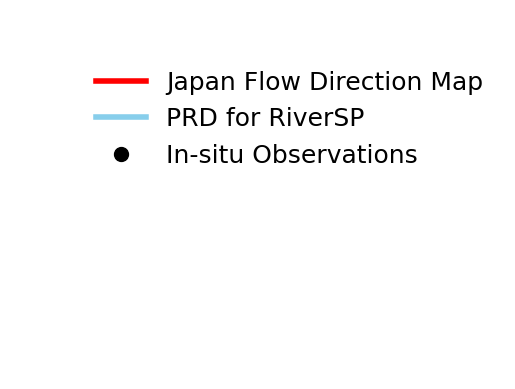

In [18]:
from matplotlib.lines import Line2D
# RiverRP legend
fig = plt.figure()
ax = fig.add_subplot(111)
legend_ax = fig.add_axes([0.8, 0.2, 0.1, 0.6]) 

legend_ele = []  
colorRP = ['red','skyblue','black']
labelRP = ['Japan Flow Direction Map','PRD for RiverSP','In-situ Observations']

# Add red and sky blue lines
for i in range(2):  # First two elements are lines
    legend_ele.append(
        Line2D([0], [0], color=colorRP[i], lw=4, label=labelRP[i])
    )

# Add black dot
legend_ele.append(
    Line2D([0], [0], marker='o', color='none', markerfacecolor=colorRP[2], markersize=10, label=labelRP[2])
)
ax.axis('off')

legend_ax.axis('off')
legend_ax.legend(handles=legend_ele, loc='best',ncol=1, frameon=False,fontsize=18)
# plt.savefig('/work/a06/yingying/swot/plot/1_RiverRP_legend.jpg', format='jpg',dpi=600)
plt.show()

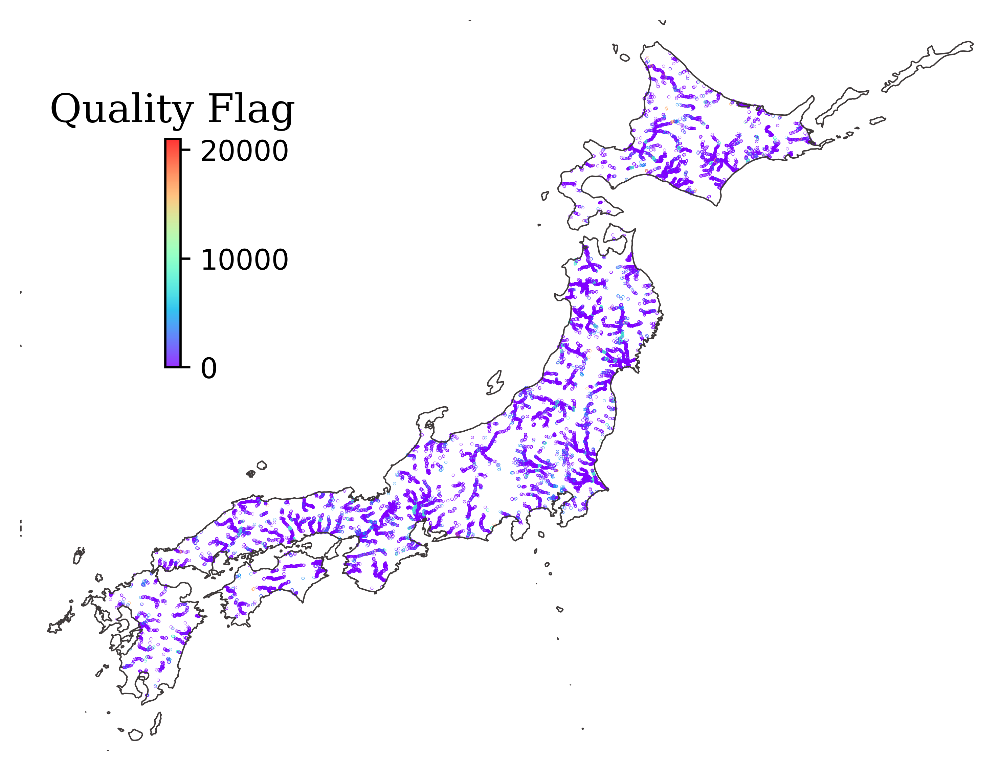

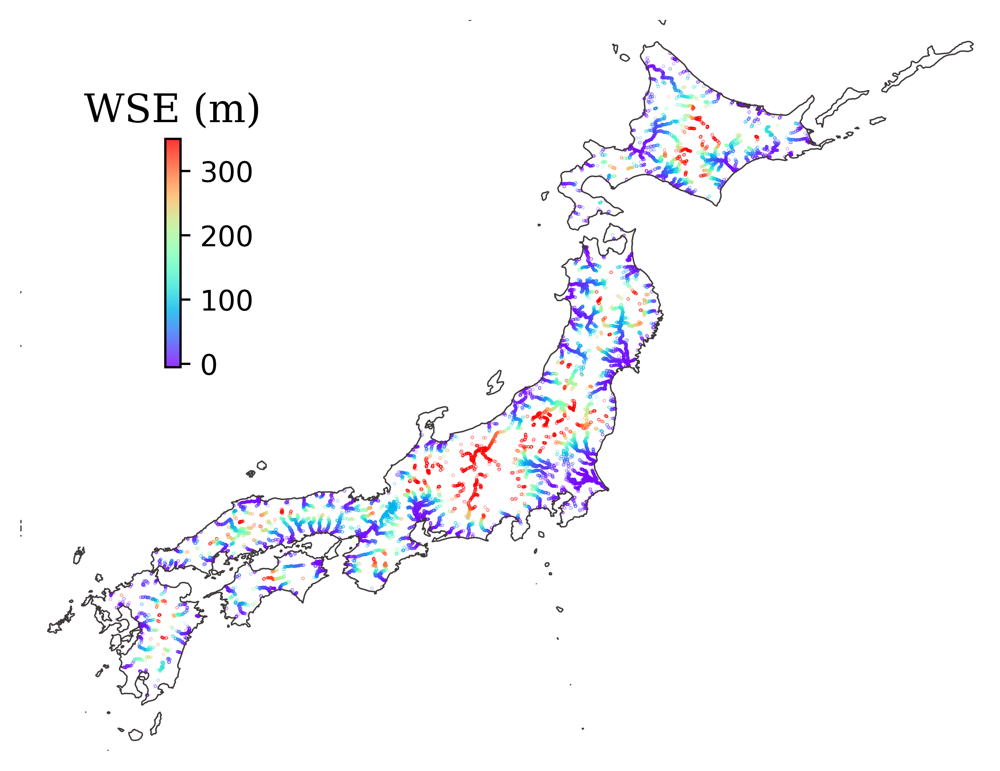

In [19]:
#%% apply river mask, exclude uparea<100
wse_point = np.where((up_point<100)|(np.isnan(up_point)),np.nan,wse_point)
qual_point = np.where((up_point<100)|(np.isnan(up_point)),np.nan,qual_point)
up_point = np.where((up_point<100)|(np.isnan(up_point)),np.nan,up_point)
lat_mask = np.where(np.isnan(sig_point)|(up_point<100)|np.isnan(up_point),np.nan,lat_point)
lon_mask = np.where(np.isnan(sig_point)|(up_point<100)|np.isnan(up_point),np.nan,lon_point)
lat_mask_plot = lat_mask[~np.isnan(lat_mask)]
lon_mask_plot = lon_mask[~np.isnan(lat_mask)]
wse_mask_plot = wse_point[~np.isnan(lat_mask)]
qual_mask_plot = qual_point[~np.isnan(lat_mask)]
draw_Japan('Quality Flag',lon_mask_plot,lat_mask_plot,qual_mask_plot,'qual_mask',0,21000,0.01)
draw_Japan('WSE (m)',lon_mask_plot,lat_mask_plot,wse_mask_plot,'wse_mask',-5,350,0.01)

main rate 45.91 %
turb rate 22.99 %
-------
main rate 49.30 %
turb rate 24.30 %
-------
main rate 49.99 %
turb rate 24.65 %
-------


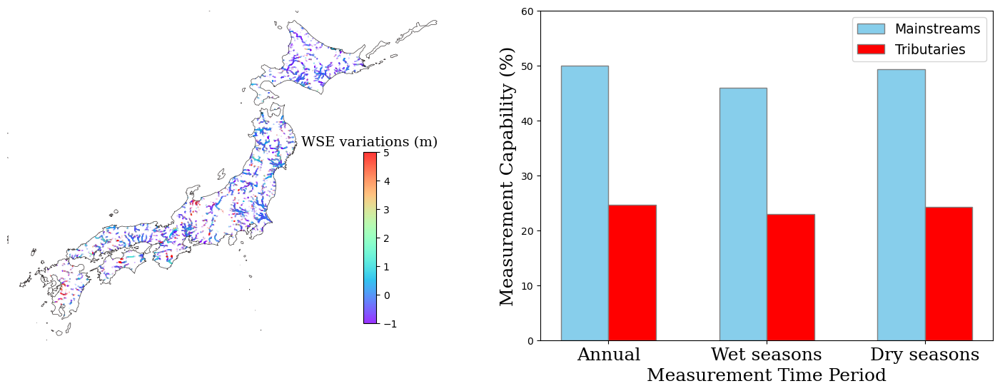

In [20]:
#%% Figure10: WSE ability
fig = plt.figure(figsize=(18,6))
ax1 = fig.add_subplot(121, projection=ccrs.PlateCarree())
ax2 = fig.add_subplot(122)
wse_main_all = np.where(up_point<10**3,np.nan,up_point)  # all grids of mainstream
wse_turb_all = np.where(up_point>10**3,np.nan,up_point)  # all grids of turbs

# WSE in wet or dry season
wse_wet_plot = wse_wet_point[~np.isnan(lat_mask)]
wse_dry_plot = wse_dry_point[~np.isnan(lat_mask)]

def draw_var_map(ax1,cbtitle,lon_plot,lat_plot,var,savefig,vmin,vmax,s):
    ax1.set_axis_off()
    ax1.set_extent([lon_min,lon_max,lat_min,lat_max], ccrs.PlateCarree())
    gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0, linestyle='-.')
    ax1.coastlines(alpha=1.,linestyle='-',color = "#3F3A3A",lw=0.5,resolution='10m',zorder=4)

    # mask the other place
    region_lon1 = [128.06, 128.06,138, 138 ]
    region_lat1 = [41 , 45.95 , 45.95, 41  ]
    region_lon2 = [128.06,128.06,131.4,131.4 ]
    region_lat2 = [34.5,41,41,34.5]
    ax1.fill(region_lon1, region_lat1, color='white', transform=ccrs.PlateCarree(), zorder=10)
    ax1.fill(region_lon2, region_lat2, color='white', transform=ccrs.PlateCarree(), zorder=10)
    
    gl.top_labels   = False
    gl.right_labels = False
    gl.bottom_labels   = False
    gl.left_labels = False
    con_plot1 = ax1.scatter(lon_plot,lat_plot,s=s,c=var,zorder=3,cmap='rainbow',transform=ccrs.PlateCarree(),alpha=0.8,vmin=vmin,vmax=vmax) 

    def color_bar(l,b,w,h):
      rect = [l,b,w,h]
      cbar_ax = fig.add_axes(rect)
      return cbar_ax
    [l2,b2,w2,h2] = [0.41,0.15,0.01,0.4]
    cbar_ax2 = color_bar(l2,b2,w2,h2)
    cb2 = plt.colorbar(con_plot1, cax=cbar_ax2,orientation="vertical",shrink=0.5)
    cb2.ax.set_title(cbtitle,fontdict=font_label)
draw_var_map(ax1,'WSE variations (m)',lon_mask_plot,lat_mask_plot,wse_wet_plot-wse_dry_plot,'wse_wet',-1,5,0.01)

# WSE ability in wet, dry, a-year 
def cal_ability(wse_point):
    wse_main = np.where((up_point<10**3)|(np.isnan(up_point))|(np.isnan(sig_point)),np.nan,wse_point)
    wse_turb = np.where((up_point>10**3)|(np.isnan(up_point))|(np.isnan(sig_point)),np.nan,wse_point)
    main_rate = np.shape(wse_main[~np.isnan(wse_main)])[0]/np.shape(wse_main_all[~np.isnan(wse_main_all)])[0]
    turb_rate = np.shape(wse_turb[~np.isnan(wse_turb)])[0]/np.shape(wse_turb_all[~np.isnan(wse_turb_all)])[0]
    print('main rate','{:.2f}'.format(main_rate*100),'%')
    print('turb rate','{:.2f}'.format(turb_rate*100),'%')
    print('-------')
    rate = [main_rate*100,turb_rate*100]
    return rate
wet_rate = cal_ability(wse_wet_point)
dry_rate = cal_ability(wse_dry_point)
points_rate = cal_ability(wse_point)

def plot_ability(ax):
    # fig,ax = plt.subplots(dpi = 600,figsize=(10,4.5))
    bar_label = ['Annual','Wet seasons','Dry seasons']
    bar_width = 0.3
    x = np.arange(0,len(bar_label))
    # ax.spines['top'].set_visible(False) 
    # ax.spines['right'].set_visible(False)  
    # ax.spines['left'].set_visible(True)   
    # ax.spines['bottom'].set_visible(True)
    ax.set_xlabel('Measurement Time Period',fontdict=font_biglabel)
    ax.set_ylabel('Measurement Capability '+r"(%)",fontdict=font_biglabel)
    ax.bar(x-bar_width/2,[points_rate[0],wet_rate[0],dry_rate[0]],width=bar_width,color='skyblue',edgecolor='grey',label='Mainstreams')     
    ax.bar(x+bar_width/2,[points_rate[1],wet_rate[1],dry_rate[1]],width=bar_width,color='red',edgecolor='grey',label='Tributaries')  
    ax.set_xticks(x)
    ax.set_xticklabels(bar_label,fontdict = font_biglabel)
    ax.legend(fontsize=13.5)
    ax.set_ylim(0,60)
plot_ability(ax2)
plt.show()
# plt.savefig('/work/a06/yingying/swot/plot/12_swot_capability.jpg', format='jpg',dpi=600)
plt.close()

In [21]:
#%% filter out big error data
def find_loc_image():
    # find image in the region
    lat_point = list()
    lon_point = list()
    wse_point = list()
    wse_wet_point = list()
    wse_dry_point = list()
    flag_point = list()
    WAD_point = list()
    bs_point = list()
    loc_count = 0
    point_count = 0
    wse_new_ = np.full((20,np.shape(up_point)[0]),np.nan)
    for loc in loc_uni:
        loc_num  = np.int32(loc)
        file_ind = np.where(file_loc==loc_num)[0]
        if np.shape(file_ind)[0] == 0:
            continue
        file_ind = np.array(file_ind,dtype=np.int32)
        lat_all  = list()
        lon_all  = list()
        wse_all  = list()
        wse_wet  = list()
        wse_dry  = list()
        quawse_all  = list()
        quaarea_all = list()
        quasig_all  = list()
        bscatter_all  = list()
        # read file image in different location
        counts = 0
        for file_read_ind in file_ind:
            file_read = region_all[int(file_read_ind)]
            lat,lon,wse,quawse,quaarea,quasig,bscatter = read_raster_nc(file_read)
            if np.array_equal(lat, np.array([-999])):
                break
            file_time = file_read[55:57]
            # wet period
            if '06' in file_time or '07' in file_time or '08' in file_time:
                wse_wet = wse_wet + [wse]
            if '12' in file_time or '01' in file_time or '02' in file_time:
                wse_dry = wse_dry + [wse]
            counts  = counts + 1
            lat_all = lat_all + [lat]
            lon_all = lon_all + [lon]
            wse_all = wse_all + [wse]
            quawse_all = quawse_all + [quawse]
            quaarea_all = quaarea_all + [quaarea]
            quasig_all = quasig_all + [quasig]
            bscatter_all = bscatter_all + [bscatter]
        if counts==0:
            continue
        loc_count = loc_count + 1
        # calculate averge of loc
        lat_mean = np.nanmean(np.array(lat_all),axis=0)
        lat_filter = lat_mean[~np.isnan(lat_mean)]
        lon_mean = np.nanmean(np.array(lon_all),axis=0)
        lon_filter = lon_mean[~np.isnan(lat_mean)]
        # calculate the high frequency flag
        flag_def = define_flag_map(counts,np.array(quawse_all),np.array(quaarea_all),np.array(quasig_all))
        flag_filter = flag_def[~np.isnan(lat_mean)] 
        
        # calculate medium
        wse_median = np.nanmedian(wse_all,axis=0)
        wse_median1 = wse_median[~np.isnan(lat_mean)]
        wse_median2 = wse_median1[~np.isnan(flag_filter)]
        delta_median = np.abs(wse_all-wse_median[np.newaxis,:,:])
        WAD = np.nanmedian(delta_median,axis=0)
        WAD1 = WAD[~np.isnan(lat_mean)]
        WAD2 = WAD1[~np.isnan(flag_filter)]
        for row in range(0,np.shape(wse_all)[0]):
            wse_row = wse_all[row][:,:]
            wse_all1 = wse_row[~np.isnan(lat_mean)]
            wse_all2 = wse_all1[~np.isnan(flag_filter)]
            dis_WAD = wse_all2-wse_median2-WAD2
            wse_new[row,point_count:point_count+np.shape(WAD2)[0]] = np.where(dis_WAD>0,np.nan,wse_all2)

        # calculate average of WSE
        wse_mean = np.nanmean(np.array(wse_all),axis=0)
        wse_filter = wse_mean[~np.isnan(lat_mean)]
        bs_mean  = np.nanmean(np.array(bscatter_all),axis=0)
        bs_filter = bs_mean[~np.isnan(lat_mean)]
        
        lat_point.extend(lat_filter[~np.isnan(flag_filter)])
        lon_point.extend(lon_filter[~np.isnan(flag_filter)])
        wse_point.extend(wse_filter[~np.isnan(flag_filter)])
        WAD_point.extend(WAD2)
        if np.shape(wse_wet)[0]!=0:
            wse_wet_mean = np.nanmean(np.array(wse_wet),axis=0)
            wse_wet_filter = wse_wet_mean[~np.isnan(lat_mean)]
            wse_wet_point.extend(wse_wet_filter[~np.isnan(flag_filter)])
        else:
            wse_wet_filter = np.full(np.shape(wse_filter[~np.isnan(flag_filter)])[0],np.nan)
            wse_wet_point.extend(wse_wet_filter)
        if np.shape(wse_dry)[0]!=0:
            wse_dry_mean = np.nanmean(np.array(wse_dry),axis=0)
            wse_dry_filter = wse_dry_mean[~np.isnan(lat_mean)]
            wse_dry_point.extend(wse_dry_filter[~np.isnan(flag_filter)])
        else:
            wse_dry_filter = np.full(np.shape(wse_filter[~np.isnan(flag_filter)])[0],np.nan)
            wse_dry_point.extend(wse_dry_filter)
        flag_point.extend(flag_filter[~np.isnan(flag_filter)])
        bs_point.extend(bs_filter[~np.isnan(flag_filter)])
        point_count = point_count + np.shape(WAD2)[0]
        # if loc_count>0:
        #     break
        print(np.shape(flag_point))
    return lat_point,lon_point,wse_point,wse_wet_point,wse_dry_point,flag_point,bs_point,wse_new,WAD_point
# lat_point,lon_point,wse_point,wse_wet_point,wse_dry_point,flag_point,bs_point,wse_new,WAD_point = find_loc_image()


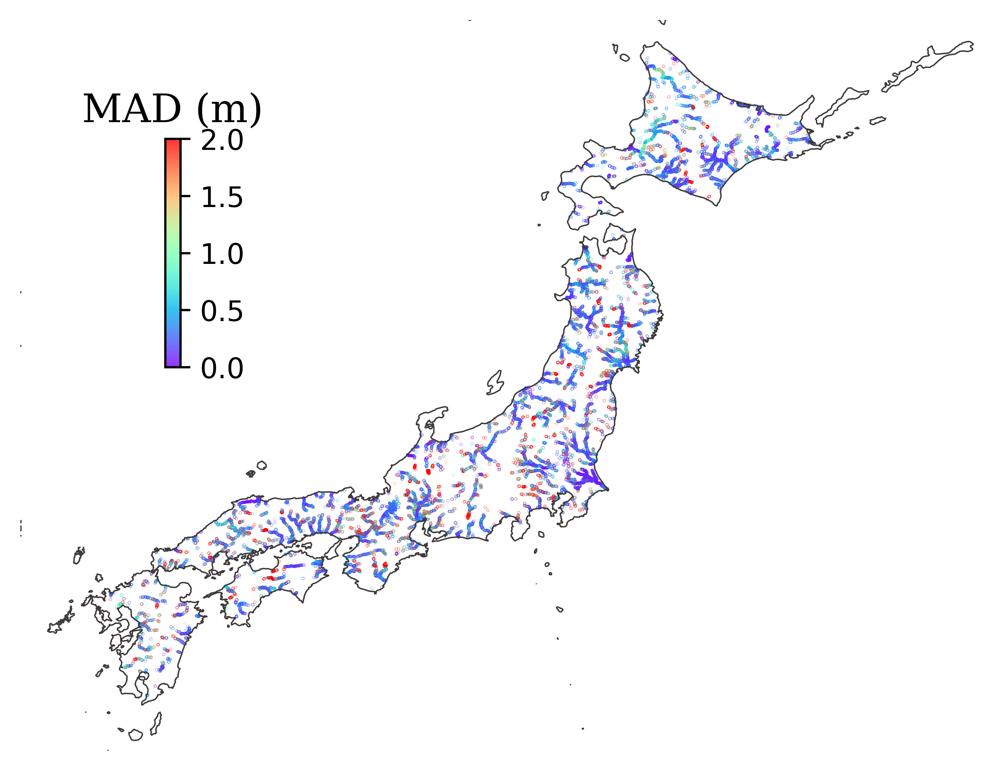

In [22]:
# Figure12: MAD
MAD_mask_plot = MAD_point[~np.isnan(lat_mask)]
draw_Japan('MAD (m)',lon_mask_plot,lat_mask_plot,MAD_mask_plot,'MAD_mask',0,2,0.01)

# river MAD
river_path = '/work/a06/yingying/SWOT/river_width/'
lat_river1 = np.load(river_path+'lat_Tone.npy')
lon_river1 = np.load(river_path+'lon_Tone.npy')
lat_river2 = np.load(river_path+'lat_Kita.npy')
lon_river2 = np.load(river_path+'lon_Kita.npy')
lat_river3 = np.load(river_path+'lat_Chi.npy')
lon_river3 = np.load(river_path+'lon_Chi.npy')
lat_river_all = np.concatenate((lat_river1,lat_river2,lat_river3))
lon_river_all = np.concatenate((lon_river1,lon_river2,lon_river3))
def fine_river_MAD():
    MAD = np.full(np.shape(lat_river_all)[0],np.nan)
    for num in range(0,np.shape(lat_river_all)[0]):
        dis = (lon_mask_plot-lon_river_all[num])**2+(lat_mask_plot-lat_river_all[num])**2
        ind = np.argmin(dis)
        MAD[num] = MAD_mask_plot[ind]
    return MAD
MAD_river_all = fine_river_MAD()
lat_MAD_bad = np.where(MAD_river_all<1,np.nan,lat_river_all)
lon_MAD_bad = np.where(MAD_river_all<1,np.nan,lon_river_all)
lat_MAD_good = np.where(MAD_river_all>1,np.nan,lat_river_all)
lon_MAD_good = np.where(MAD_river_all>1,np.nan,lon_river_all)
lat_MAD_bad_csv = lat_MAD_bad[::10]
lon_MAD_bad_csv = lon_MAD_bad[::10]
lat_MAD_good_csv = lat_MAD_good[::100]
lon_MAD_good_csv = lon_MAD_good[::100]
# google map landscape
with open(river_path+'MAD_bad.csv', mode='w', newline='') as file1:
    writer = csv.writer(file1)
    writer.writerow(["Latitude", "Longitude"])
    for ind in range(0,np.shape(lat_MAD_bad_csv)[0]):
        writer.writerow([lat_MAD_bad_csv[ind],lon_MAD_bad_csv[ind]])
    file1.close()
with open(river_path+'MAD_good.csv', mode='w', newline='') as file2:
    writer = csv.writer(file2)
    writer.writerow(["Latitude", "Longitude"])
    for ind in range(0,np.shape(lat_MAD_good_csv)[0]):
        writer.writerow([lat_MAD_good_csv[ind],lon_MAD_good_csv[ind]])
    file2.close()

25 [0.20693588 0.17712262 0.15295646 0.16638184]
75 [1.80314636 0.91962433 0.6735611  0.59796596]
mean [0.55196762 0.33943847 0.29410219 0.29866123]
25 [0.09127283 0.08879316 0.07485491 0.08282638]
75 [0.89539021 0.4436264  0.34560513 0.33420532]
mean [0.26489496 0.1878299  0.15673184 0.16639137]
------
25 [0.20233154 0.19779921 0.19797897 0.19102655 0.14506692]
75 [1.52105713 1.44034576 1.16991746 0.98422027 0.85777092]
mean [0.48139954 0.44665718 0.41950619 0.37261581 0.29444122]
25 [0.09233093 0.08786607 0.08877245 0.09078813 0.07536677]
75 [0.73952103 0.66791159 0.56436209 0.44635022 0.44546743]
mean [0.23974895 0.22348088 0.21220326 0.19640732 0.17129511]


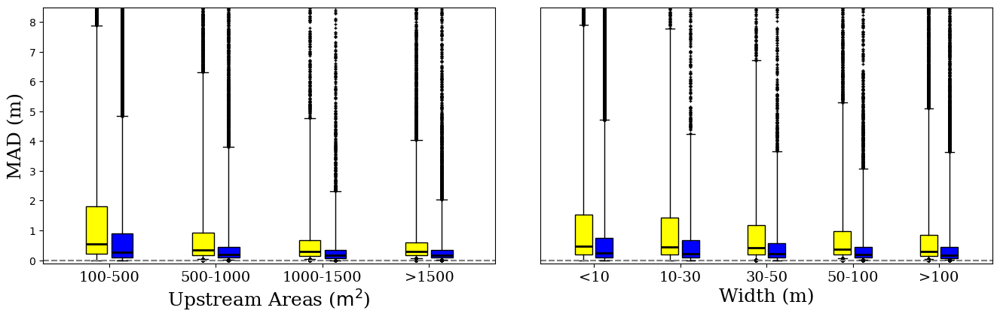

------


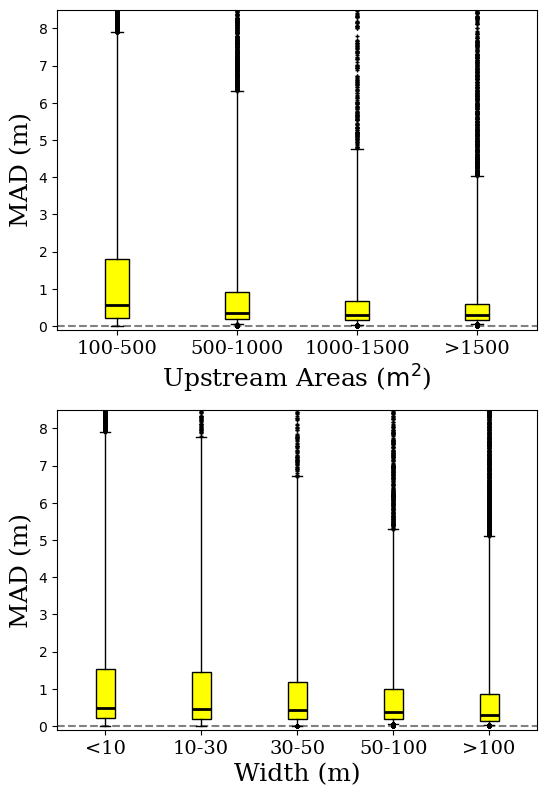

In [23]:
# Figure12: performance of MAD filter
up_label = ['100-500','500-1000','1000-1500','>1500']
wid_label = ['<10','10-30','30-50','50-100','>100']
def MAD_up_group(MAD_point):
    MAD_group1 = np.where((up_point<=100)|(up_point>500)|(np.isnan(up_point)),np.nan,MAD_point)
    MAD_group2 = np.where((up_point<=500)|(up_point>1000)|(np.isnan(up_point)),np.nan,MAD_point)
    MAD_group3 = np.where((up_point<=1000)|(up_point>1500)|(np.isnan(up_point)),np.nan,MAD_point)
    MAD_group4 = np.where((up_point<=1500)|(np.isnan(up_point)),np.nan,MAD_point)
    MAD_wid_all = [MAD_group1.flatten(),MAD_group2.flatten(),MAD_group3.flatten(),MAD_group4.flatten()]
    return MAD_wid_all
def MAD_wid_group(MAD_point):
    MAD_group1 = np.where((up_point<=100)|(np.isnan(up_point)|(wid_point>10)),np.nan,MAD_point)
    MAD_group2 = np.where((up_point<=100)|(np.isnan(up_point)|(wid_point<=10)|(wid_point>30)),np.nan,MAD_point)
    MAD_group3 = np.where((up_point<=100)|(np.isnan(up_point)|(wid_point<=30)|(wid_point>50)),np.nan,MAD_point)
    MAD_group4 = np.where((up_point<=100)|(np.isnan(up_point)|(wid_point<=50)|(wid_point>100)),np.nan,MAD_point)
    MAD_group5 = np.where((up_point<=100)|(np.isnan(up_point)|(wid_point<=100)),np.nan,MAD_point)
    MAD_wid_all = [MAD_group1.flatten(),MAD_group2.flatten(),MAD_group3.flatten(),MAD_group4.flatten(),MAD_group5.flatten()]
    return MAD_wid_all 
# MAD_new_medium = np.nanmedian(wse_new_MAD,axis=0)
# diff_new  = np.abs(wse_new_MAD-MAD_new_medium)
# MAD_new_point = np.nanmedian(diff_new,axis=0)
MAD_up_all = MAD_up_group(MAD_point)
MAD_up_new = MAD_up_group(MAD_new_point)
MAD_wid_all = MAD_wid_group(MAD_point)
MAD_wid_new = MAD_wid_group(MAD_new_point)

fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15, 5))
ax1.set_position([0.1, 0.3, 0.4, 0.68])
ax2.set_position([0.54, 0.3, 0.4, 0.68])
def plot_two_box(ax,data,xloc,label,c):   
    # font_label = {'family': 'serif', 'weight': 'normal', 'size': 13.5}
    flag_mean = np.full(np.shape(data)[0],np.nan)
    q1 = np.full(np.shape(data)[0],np.nan)
    q3 = np.full(np.shape(data)[0],np.nan)
    # data = data[:, ~np.isnan(data).all(axis=0)]
    x = np.arange(0,np.shape(data)[0])
    ax.axhline(y=0,color='gray',linestyle='--',lw=1.5)
    for flag in range(0,np.shape(data)[0]):
        diff_each = np.delete(data[flag][:],np.where(np.isnan(data[flag][:])))
        q1[flag] = np.percentile(diff_each, 25)  # 25th percentile
        q3[flag] = np.percentile(diff_each, 75)  # 75th percentile
        flag_mean[flag] = np.median(diff_each)
        ax.boxplot(diff_each,positions=[x[flag]+xloc],widths=0.2,medianprops=dict(color='black', linewidth=2),flierprops=dict(marker='+', color='red', markersize=2.5,lw=2.5), patch_artist=True,boxprops=dict(facecolor=c, linewidth=1), whis=[5, 95])
        ax.set_xticks(x)
        ax.set_xticklabels(label,fontdict=font_label)
    print('25',q1)
    print('75',q3)
    print('mean',flag_mean)
# plot absolute WSE
plot_two_box(ax1,MAD_up_all,-0.12,up_label,'yellow')
plot_two_box(ax1,MAD_up_new,+0.12,up_label,'blue')
ax1.set_ylim(-0.1,8.5)
ax1.set_xlabel('Upstream Areas '+r"($\mathrm{m^2}$)",fontdict=font_title)
ax1.set_ylabel('MAD (m)',fontdict=font_title)
print('------')
plot_two_box(ax2,MAD_wid_all,-0.12,wid_label,'yellow')
plot_two_box(ax2,MAD_wid_new,+0.12,wid_label,'blue')
ax2.set_ylim(-0.1,8.5)
ax2.set_xlabel('Width (m)',fontdict=font_title)
ax2.set_yticks([])
ax2.set_yticklabels([])
plt.show()
# plt.savefig('/work/a06/yingying/swot/plot/12_MAD.jpg', format='jpg',dpi=600)
plt.close()


fig, (ax1,ax2) = plt.subplots(1,2,figsize=(6,8))
ax1.set_position([0.1, 0.1, 0.8, 0.4])
ax2.set_position([0.1, 0.6, 0.8, 0.4])
def plot_box(ax,data,label,c):   
    # font_label = {'family': 'serif', 'weight': 'normal', 'size': 13.5}
    flag_mean = np.full(np.shape(data)[0],np.nan)
    q1 = np.full(np.shape(data)[0],np.nan)
    q3 = np.full(np.shape(data)[0],np.nan)
    # data = data[:, ~np.isnan(data).all(axis=0)]
    x = np.arange(0,np.shape(data)[0])
    ax.axhline(y=0,color='gray',linestyle='--',lw=1.5)
    for flag in range(0,np.shape(data)[0]):
        diff_each = np.delete(data[flag][:],np.where(np.isnan(data[flag][:])))
        q1[flag] = np.percentile(diff_each, 25)  # 25th percentile
        q3[flag] = np.percentile(diff_each, 75)  # 75th percentile
        flag_mean[flag] = np.median(diff_each)
        ax.boxplot(diff_each,positions=[x[flag]],widths=0.2,medianprops=dict(color='black', linewidth=2),flierprops=dict(marker='+', color='red', markersize=2.5,lw=2.5), patch_artist=True,boxprops=dict(facecolor=c, linewidth=1), whis=[5, 95])
        ax.set_xticks(x)
        ax.set_ylabel('MAD (m)',fontdict=font_title)
        ax.set_xticklabels(label,fontdict=font_label)
# plot absolute WSE
plot_box(ax1,MAD_wid_all,wid_label,'yellow')
ax1.set_ylim(-0.1,8.5)
ax1.set_xlabel('Width (m)',fontdict=font_title)
print('------')
plot_box(ax2,MAD_up_all,up_label,'yellow')
ax2.set_ylim(-0.1,8.5)
ax2.set_xlabel('Upstream Areas '+r"($\mathrm{m^2}$)",fontdict=font_title)
# plt.show()
plt.savefig('/work/a06/yingying/swot/plot/12_MAD_ori.jpg', format='jpg',dpi=600)


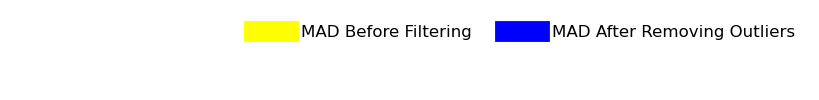

In [24]:
# Create a new figure for the legend
fig = plt.figure(figsize=(10, 1))  # Adjust size as needed
legend_ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])  # Position for the legend axes

# Define legend elements
legend_elements = [
    Line2D([0], [0], color='yellow', lw=15, label='MAD Before Filtering'),  # Line for whiskers
    Line2D([0], [0], color='blue', lw=15, label='MAD After Removing Outliers')]  # Line for filtered whiskers
# Remove axes from the legend figure
legend_ax.axis('off')

# Add the legend to the figure
legend_ax.legend(handles=legend_elements, loc='best', ncol=2, frameon=False, fontsize=12)
# plt.show()
plt.savefig('/work/a06/yingying/swot/plot/12_MAD_legend.jpg', format='jpg',dpi=600)


main rate 62.97 %
turb rate 61.74 %
-------
main rate 52.83 %
turb rate 35.98 %
-------


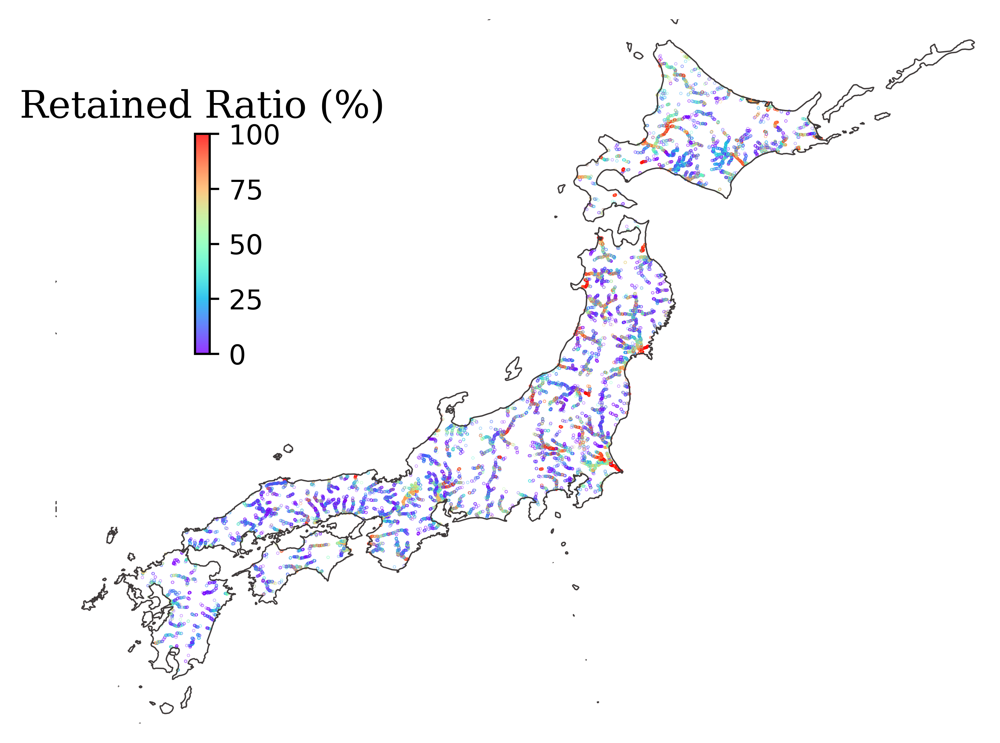

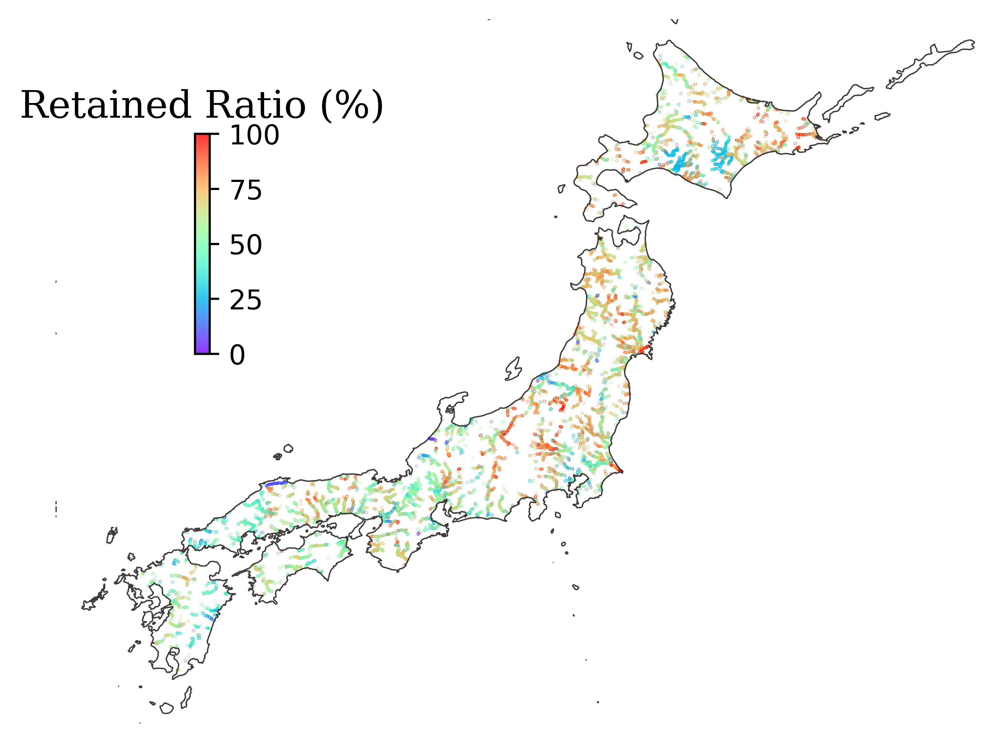

In [25]:
# Figure13: Filter effectiveness
# WSE availability in mainstream, turbutury 
# all: 15 times measurements
filter_MAD_number = np.sum(~np.isnan(wse_new_MAD),axis=0)/15.
filter_MAD_number = np.where(filter_MAD_number>1,1,filter_MAD_number)
filter_flag_number = flag_count/15.
def cal_MAD_ability(MAD_number):
    MAD_main = np.where((up_point<10**3)|(np.isnan(up_point))|(np.isnan(sig_point)),np.nan,MAD_number)
    MAD_turb = np.where((up_point>10**3)|(np.isnan(up_point))|(np.isnan(sig_point)),np.nan,MAD_number)
    main_mean = np.nanmean(MAD_main)
    turb_mean = np.nanmean(MAD_turb)
    print('main rate','{:.2f}'.format(main_mean*100),'%')
    print('turb rate','{:.2f}'.format(turb_mean*100),'%')
    print('-------')
    rate = [main_mean*100,turb_mean*100]
    return main_mean,turb_mean
main_MAD,turb_MAD   = cal_MAD_ability(filter_MAD_number)
main_flag,turb_flag = cal_MAD_ability(filter_flag_number)
MAD_mask  = filter_MAD_number[~np.isnan(lat_mask)]
flag_mask = filter_flag_number[~np.isnan(lat_mask)]

# MAD filter map
draw_Japan('Retained Ratio (%)',lon_mask_plot,lat_mask_plot,flag_mask*100,'flag_filter_rate',0,100,0.01)
draw_Japan('Retained Ratio (%)',lon_mask_plot,lat_mask_plot,MAD_mask*100,'MAD_filter_rate',0,100,0.01)


In [26]:
def plot_ability(filter_name,main_flag,turb_flag):
    fig,ax = plt.subplots(dpi = 600,figsize=(5,3))
    bar_width = 0.2
    bar_label = ['Mainstreams','Tributaries']
    x = np.arange(0,len(bar_label))/2.5
    ax.spines['top'].set_visible(False) 
    ax.spines['right'].set_visible(False)  
    ax.spines['left'].set_visible(False)   
    ax.spines['bottom'].set_visible(True)
    # ax.set_xlabel(filter_name,fontdict=font_biglabel)
    # ax.set_ylabel('Retained Measurement Ratio '+r"(%)",fontdict=font_biglabel)
    ax.bar(x,[main_flag*100,turb_flag*100],width=bar_width,color=['skyblue','red'],edgecolor='grey')     
    ax.set_xticks(x)
    ax.set_xticklabels(bar_label,fontdict = font_biglabel)
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.text(x[0]-0.055,main_flag*100+3.5,'{:.2f}'.format(main_flag*100)+' %',fontdict=font_biglabel)
    ax.text(x[1]-0.055,turb_flag*100+3.5,'{:.2f}'.format(turb_flag*100)+' %',fontdict=font_biglabel)
    # ax.legend(fontsize=13.5)
    # ax.set_ylim(0,80)
plot_ability('Quality flags filter',main_flag,turb_flag)
# plt.show()
plt.savefig('/work/a06/yingying/swot/plot/13_quality_flag_filter.jpg', format='jpg',dpi=600)
plt.close()
plot_ability('MAD filter',main_MAD,turb_MAD)
# plt.show()
plt.savefig('/work/a06/yingying/swot/plot/13_MAD_filter.jpg', format='jpg',dpi=600)
plt.close()


In [27]:
# sat wse
data_all = np.load(path_raster+'swot_gauges.npy')
# data[station_num,filelen]
sat_wse    = data_all[:,0,:]
quawse = data_all[:,1,:]
quaarea= data_all[:,2,:]
quasig = data_all[:,3,:]
npix   = data_all[:,4,:]
obs    = data_all[:,5,:]
obs = np.where(obs<-999,np.nan,obs)
re_MAD = remake_MAD.T

# obs ref
df  = pd.read_csv("/work/a06/yingying/SWOT/gauge/MLIT_FlowGauge_new_info.csv")
site_name = np.array(df.iloc[:,0].values)
ref = np.array(df.iloc[:,1].values)
ref = np.where(ref==999,np.nan,ref)
# # call situ reference height
path_alloc   = '/work/a06/yingying/obs/alloc/'
name_alloc   = 'wlv_2019h.xlsx'
file_path = path_alloc+name_alloc
df = pd.read_excel(file_path)
id_info =  np.array(df.iloc[:,0])
lat_situ =  np.array(df.iloc[:,1])
lon_situ =  np.array(df.iloc[:,2])
ix     = np.array(df.iloc[:,8])-1
iy     = np.array(df.iloc[:,9])-1
ref_situ = np.full((len(id_info)),np.nan)
for situ in range(0,len(id_info)):
    where_ref= np.where(site_name == id_info[situ])[0]
    ref_situ[situ] = ref[where_ref[0]]
ref_situ = np.where(ref_situ>998.9,np.nan,ref_situ)

obs_wse = obs+ref_situ[:,np.newaxis]
obs_wse = np.where(obs_wse<-999,np.nan,obs_wse)
qual_filter = 18000
obs_wse = np.where((quawse>qual_filter)|(quaarea>qual_filter)|(quasig>qual_filter),np.nan,obs_wse)
sat_wse = np.where((quawse>qual_filter)|(quaarea>qual_filter)|(quasig>qual_filter),np.nan,wse)

obs_wse = obs+ref_situ[:,np.newaxis]
MAD_median = np.nanmedian(sat_wse,axis=1)
dis_MAD = np.abs(sat_wse-MAD_median[:,np.newaxis])

### apply MAD filter (MAD: 距平的中位数)
sat_wse_new = np.full((np.shape(sat_wse)[0],np.shape(sat_wse)[1]),np.nan)
re_quawse = np.full((np.shape(sat_wse)[0],np.shape(sat_wse)[1]),np.nan)
re_quaarea = np.full((np.shape(sat_wse)[0],np.shape(sat_wse)[1]),np.nan)
re_quasig = np.full((np.shape(sat_wse)[0],np.shape(sat_wse)[1]),np.nan)
for row in range(0,np.shape(re_MAD)[0]):
    # distance at each location
    sat_wse_new[row,:] = np.where(dis_MAD[row,:]>re_MAD[row],np.nan,sat_wse[row,:])
    re_quawse[row,:] = np.where(dis_MAD[row,:]>re_MAD[row],np.nan,quawse[row,:])
    re_quaarea[row,:] = np.where(dis_MAD[row,:]>re_MAD[row],np.nan,quaarea[row,:])
    re_quasig[row,:] = np.where(dis_MAD[row,:]>re_MAD[row],np.nan,quasig[row,:])


/home/yingying/miniconda/envs/data/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,


223


/tmp/ipykernel_340083/2576692790.py:69: RuntimeWarning: Mean of empty slice
  diff_mean_all = np.nanmean(sat_only_value)-np.nanmean(obs_only_value)
/tmp/ipykernel_340083/2576692790.py:36: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean((obs_wse-sat_wse)**2))


12422.0 mean 8.103894368769929 rmse 18.856468956418503
how many points: 57
12294.0 mean 77.84017213641317 rmse 118.5434071955481
how many points: 121
8326.0 mean 7.3537169000570515 rmse 18.4924289752504
how many points: 86
8198.0 mean 31.66467932180383 rmse 42.140476446674704
how many points: 97
4230.0 mean 19.62255595044391 rmse 62.94163805554531
how many points: 109
4102.0 mean 35.56624238653025 rmse 63.002774224816804
how many points: 325
390.0 mean 2.317855008032666 rmse 40.6453100655031
how many points: 1247
386.0 mean 4.853877843230769 rmse 2.8964533688195444
how many points: 35
262.0 mean 6.54160614985787 rmse 26.249340831348878
how many points: 791
134.0 mean 6.606032729681637 rmse 16.67254507374898
how many points: 542
6.0 mean 18.656917540642112 rmse 13.141676450874408
how many points: 661
2.0 mean -2.3459807452725343 rmse 4.750069546783444
how many points: 52
0.0 mean -1.3920217777764252 rmse 2.9579185392518466
how many points: 97
how many types of quality flag: 13


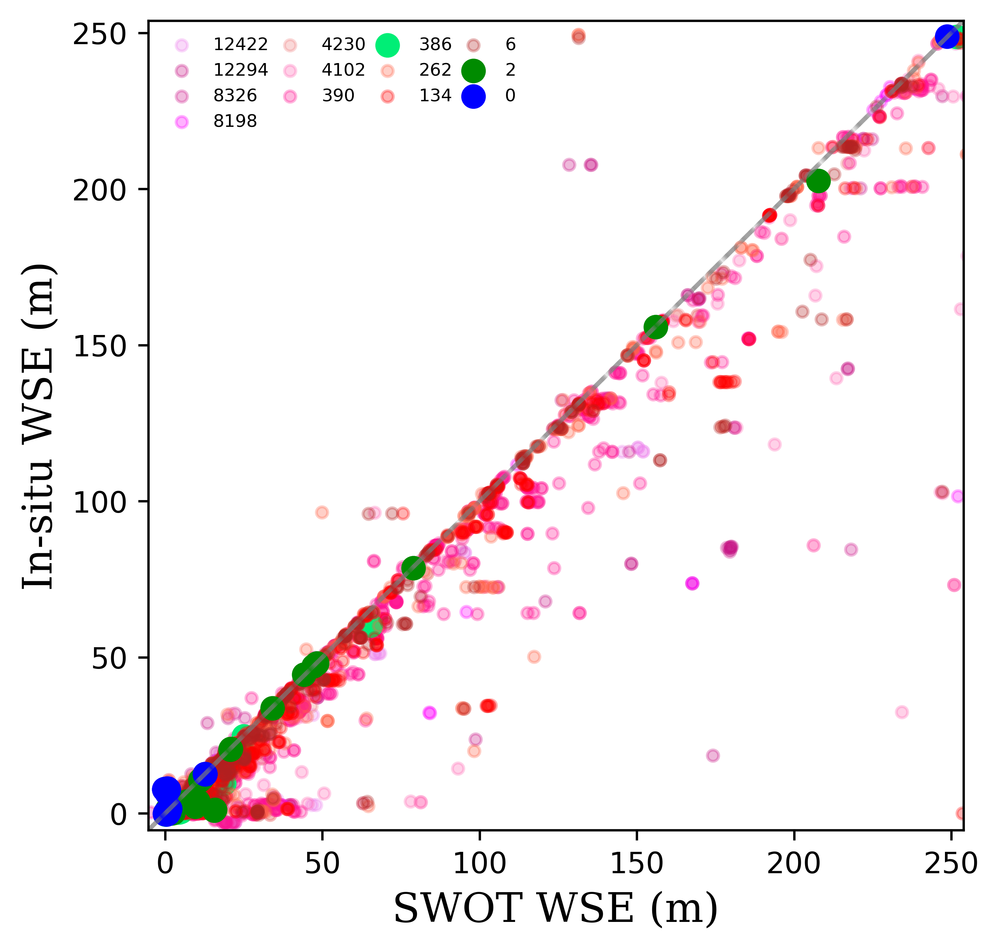

In [28]:
# Figure14: remake quality flags after filtering MAD
cmap = plt.cm.tab20
qual_label = ['0','2','4','6','128+2','128+6','256+0','256+2','256+4','256+6','256+128+2','256+128+6','4096+0','4096+2','4096+4','4096+6','4096+128+6',
              '8192+0','8192+6','8192+128+6','8192+4096+6','8192+4096+128+6','16384+4102+6']
qual_label = qual_label[::-1]
qual_flag_type = [0,2,4,6,130,134,256,258,260,262,386,390,4096,4098,4100,4102,4230,8192,8198,8326,12294,12422,20492]
qual_no6 = [0,2,4,130,256,258,260,386,4096,4098,4100,8192]
color_no6 = [22,21,20,18,16,15,14,12,10,9,8,5]
qual_MAD_index = [21,20,19,18,16,15,11,10,9,5,3,1,0]

hex_colors = ['#0000FF','#008B00','#8B6914','#B22222',
             '#548B54','#FF0000',
             '#00C5CD','#00CD66','#FFFF00','#FF6347','#00EE76','#FF1493',
             '#00E5EE','#00FF7F','#EEB422','#FF69B4','#F08080',
             '#00F5FF','#FF00FF','#D02090','#C71585','#EE82EE','#DDA0DD']
hex_colors_ori = hex_colors
hex_colors = hex_colors[::-1]
colors = [tuple(int(x * 255) for x in to_rgb(color)) for color in hex_colors]
flag1 = np.unique(re_quawse)
flag2 = np.unique(re_quaarea)
flag3 = np.unique(re_quasig)
qual_all = np.full((np.shape(re_quawse)[0],max(len(flag1),len(flag2),len(flag3))),np.nan)
qual_all[0,0:len(flag1)] = flag1
qual_all[1,0:len(flag2)] = flag2
qual_all[2,0:len(flag3)] = flag3
qual_type = np.unique(qual_all)
# np.save('flag_type.npy',np.array(qual_type,dtype=np.int32))
qual_ctrl = np.where(qual_type<32768)[0][-1]
print(qual_ctrl)
hex_filter = list()
for index in range(0,len(qual_MAD_index)):
    hex_filter = hex_filter + [hex_colors_ori[qual_MAD_index[index]]]


def cal_rmse(obs_wse,sat_wse):
    rmse = np.sqrt(np.nanmean((obs_wse-sat_wse)**2))
    return rmse

def delete_wse_nan(obs_plot,sat_plot):
    obs_wlv  = obs_plot[:,~np.all(np.isnan(sat_plot),axis=0)]
    sat_wlv  = sat_plot[:,~np.all(np.isnan(sat_plot),axis=0)]
    sat_line = sat_wlv.reshape(1,np.shape(sat_wlv)[0]*np.shape(sat_wlv)[1])
    obs_line = obs_wlv.reshape(1,np.shape(obs_wlv)[0]*np.shape(obs_wlv)[1])
    sat_only_value = np.delete(sat_line,np.where(np.isnan(sat_line)))
    obs_only_value = np.delete(obs_line,np.where(np.isnan(sat_line)))
    return sat_only_value,obs_only_value

def plot_wlv_comparison(obs,sat,s_small,hex_filter,title):
    wse_diff_MAD = np.full((1500,20),np.nan)
    wse_adiff_point = np.full((5000,len(hex_colors)),np.nan)  # [qual_nums,qual_types]
    fig,ax = plt.subplots(dpi = 600,figsize=(5,5))
    def plot_wlv_scatter(ax,obs,sat,qual):
        flag = qual_type[qual]
        ax.set_xlabel('SWOT WSE (m)',fontdict=font_label)
        ax.set_ylabel('In-situ WSE (m)',fontdict=font_label)
        if int(flag) == 7:
            obs_plot = np.where((re_quasig!=flag),np.nan,obs)
            sat_plot = np.where((re_quasig!=flag),np.nan,sat)
        if int(flag) == 8|10|12|14:
            obs_plot = np.where((re_quaarea!=flag),np.nan,obs)
            sat_plot = np.where((re_quaarea!=flag),np.nan,sat)
        if (int(flag) >= 256) & (int(flag) < 10**3):
            obs_plot = np.where((re_quaarea!=flag)|(re_quasig!=flag),np.nan,obs)
            sat_plot = np.where((re_quaarea!=flag)|(re_quasig!=flag),np.nan,sat)            
        else:
            obs_plot = np.where((re_quawse!=flag)|(re_quaarea!=flag)|(re_quasig!=flag),np.nan,obs)
            sat_plot = np.where((re_quawse!=flag)|(re_quaarea!=flag)|(re_quasig!=flag),np.nan,sat)
        sat_only_value,obs_only_value = delete_wse_nan(obs_plot,sat_plot)
        diff_mean_all = np.nanmean(sat_only_value)-np.nanmean(obs_only_value)
        rmse_all = cal_rmse(obs_only_value,sat_only_value)
        if np.shape(sat_only_value)[0]<30:
            return [-999],[-999],None,None,flag,None
        else:
            print(flag,'mean',diff_mean_all,'rmse',rmse_all)
            print('how many points:',np.shape(sat_only_value)[0])
            point_num = np.shape(sat_only_value)[0]
            axis_min = np.nanmin([obs_plot,sat_plot])-5
            axis_max = np.nanmax([obs_plot,sat_plot])+5
            if (~np.isnan(axis_min))&(~np.isnan(axis_max)):
                ax.plot([axis_min,axis_max],[axis_min,axis_max],linestyle='--',color='gray',alpha=0.1)
                ax.set_xlim(axis_min,axis_max)
                ax.set_ylim(axis_min,axis_max)
                # print(cal_rmse(obs_plot-sat_plot))
            return sat_plot,obs_plot,sat_only_value,obs_only_value,flag,point_num
    # all types
    def plot_all_flags(qual2,qual1,color_ind):
        flag_plot = list()
        for qual in range(qual2,qual1,-1):
            sat_plot,obs_plot,sat_only_value,obs_only_value,flag,point_num = plot_wlv_scatter(ax,obs,sat,qual)  
            if np.array_equal(sat_plot, np.array([-999])):
                continue
            # sat-obs measurement
            wse_adiff_point[0:point_num,color_ind] = sat_only_value-obs_only_value
            if np.isin(flag,qual_no6):
                ax.scatter(sat_plot,obs_plot,s=55,c=hex_filter[color_ind],alpha=1,label=str(int(flag)))
            else:
                ax.scatter(sat_plot,obs_plot,s=s_small,c=hex_filter[color_ind],alpha=0.3,label=str(int(flag)))
            if flag==6:
                diff6_MAD = np.abs(sat_plot-obs_plot).flatten()
            
            # for calculate RMSE
            sat_only_plot,obs_only_plot = delete_wse_nan(obs_plot,sat_plot)
            wse_diff_MAD[0:np.shape(sat_only_plot)[0],color_ind] = np.abs(sat_only_plot-obs_only_plot)
            color_ind = color_ind+1
            flag_plot = flag_plot + [int(qual_type[qual])]
        print('how many types of quality flag:',color_ind)
        plt.legend(ncol=4,loc='upper left',fontsize=6, columnspacing=0.2, frameon=False)
        plt.show()
        # plt.savefig('/work/a06/yingying/swot/plot/14_remake_'+title+'.jpg', format='jpg',dpi=600)
        plt.close()
        return flag_plot,diff6_MAD
    flag_plot,diff6_MAD = plot_all_flags(qual_ctrl-1,0-1,0)

    # specific types
    def plot_specific_flag(flag_ind):
        fig,ax = plt.subplots(dpi = 600,figsize=(5,5))
        sat_plot,obs_plot,sat_only_value,obs_only_value,flag,point_num = plot_wlv_scatter(ax,obs,sat,flag_ind)
        ax.set_xlabel('SWOT WSE (m)',fontdict=font_label)
        ax.set_ylabel('In-situ WSE (m)',fontdict=font_label)
        ax.plot([-50,700],[-50,700],linestyle='--',color='gray',alpha=0.8)
        ax.scatter(sat_plot,obs_plot,s=5,c=hex_colors_ori[flag_ind],alpha=1)
        plt.show()
        plt.close()
    # plot_specific_flag(1) # flag:2  
    # plot_specific_flag(2) # flag:4
    # plot_specific_flag(3) # flag:6  
    return flag_plot,wse_diff_MAD,diff6_MAD
flag_plot,wse_diff_MAD,diff6_MAD = plot_wlv_comparison(obs_wse,sat_wse_new,15,hex_filter,'MAD')

235


/tmp/ipykernel_340083/2205507358.py:48: RuntimeWarning: Mean of empty slice
  diff_mean_all = np.nanmean(sat_only_value)-np.nanmean(obs_only_value)
/tmp/ipykernel_340083/2576692790.py:36: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean((obs_wse-sat_wse)**2))


12422.0 mean 31.533485252914744 rmse 71.04311464205638
how many points: 464
12294.0 mean 206.43123966268612 rmse 279.09565804781784
how many points: 2290
8326.0 mean 16.935803562014456 rmse 69.66624094271218
how many points: 405
8198.0 mean 100.28831897008259 rmse 193.10503199720472
how many points: 706
8192.0 mean -23.56229687418406 rmse 48.084567658880935
how many points: 61
4230.0 mean 18.077549530137603 rmse 59.33751476963999
how many points: 549
4102.0 mean 124.2038541962948 rmse 212.26699720640136
how many points: 2856
4100.0 mean 32.341147013115574 rmse 114.07636437362869
how many points: 49
4098.0 mean 49.919315963563434 rmse 146.51490775072313
how many points: 93
4096.0 mean -0.2397855053121849 rmse 2.8395834652141017
how many points: 75
390.0 mean 4.490616746769234 rmse 34.07812109717755
how many points: 4056
386.0 mean 1.0722419226366142 rmse 19.079366841153053
how many points: 95
262.0 mean 27.053645905390837 rmse 86.46171710473742
how many points: 3208
260.0 mean 1.9366472

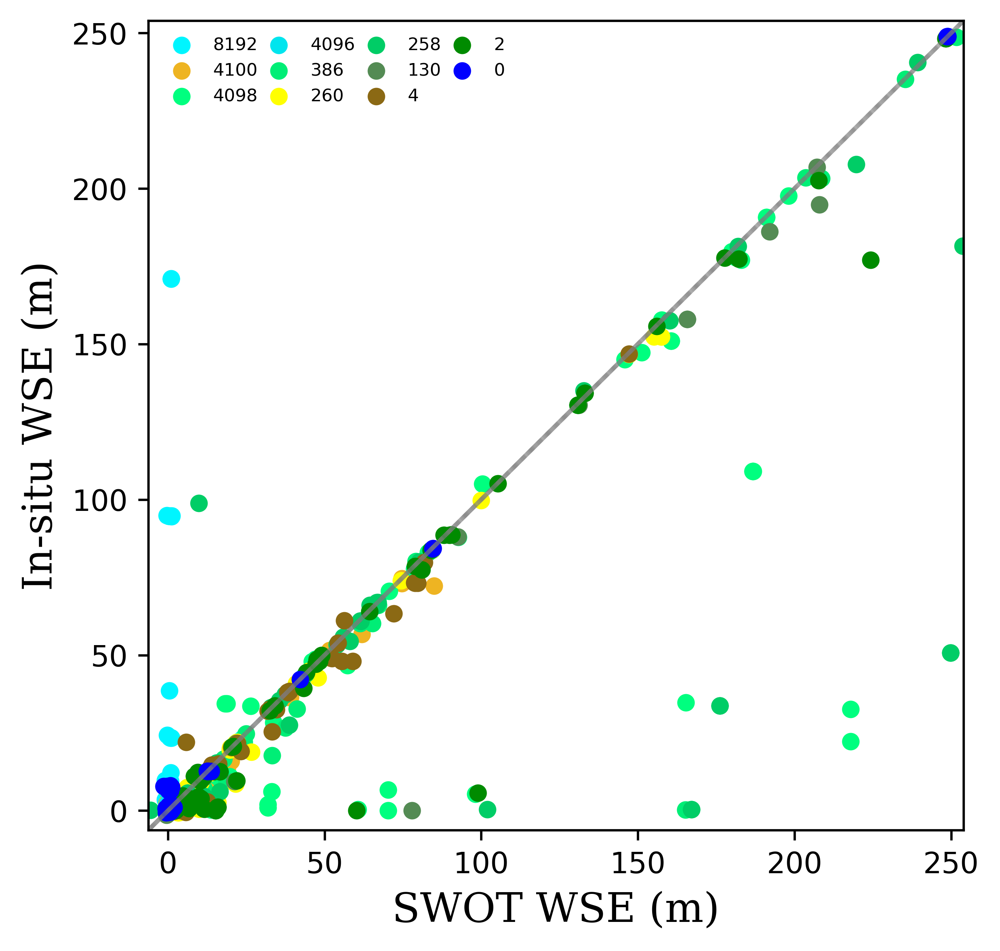

In [29]:
#%% Figure14: remake after applying quality flag filter
flag1 = np.unique(quawse)
flag2 = np.unique(quaarea)
flag3 = np.unique(quasig)
qual_all = np.full((np.shape(quawse)[0],max(len(flag1),len(flag2),len(flag3))),np.nan)
qual_all[0,0:len(flag1)] = flag1
qual_all[1,0:len(flag2)] = flag2
qual_all[2,0:len(flag3)] = flag3
qual_type = np.unique(qual_all)
# np.save('flag_type.npy',np.array(qual_type,dtype=np.int32))
qual_ctrl = np.where(qual_type<32768)[0][-1]
print(qual_ctrl)

cmap = plt.cm.tab20
qual_label = ['0','2','4','6','128+2','128+6','256+0','256+2','256+4','256+6','256+128+2','256+128+6','4096+0','4096+2','4096+4','4096+6','4096+128+6',
              '8192+0','8192+6','8192+128+6','8192+4096+6','8192+4096+128+6','16384+4102+6']
qual_label = qual_label[::-1]
# colors = [cmap(i) for i in range(40)]
# Convert these colors to hexadecimal
# hex_colors = [mcolors.rgb2hex(color) for color in colors]

colors = [tuple(int(x * 255) for x in to_rgb(color)) for color in hex_colors]
qual_flag_index = [17,14,13,12,10,8,7,4,2,1,0]
hex_flag_filter = list()
for index in range(0,len(qual_flag_index)):
    hex_flag_filter = hex_flag_filter + [hex_colors_ori[qual_flag_index[index]]]

def plot_wlv_comparison(obs,sat,title):
    wse_adiff_point = np.full((5000,len(hex_colors)),np.nan)  # [qual_nums,qual_types]
    fig,ax = plt.subplots(dpi = 600,figsize=(5,5))
    def plot_wlv_scatter(ax,obs,sat,qual):
        flag = qual_type[qual]
        ax.set_xlabel('SWOT WSE (m)',fontdict=font_label)
        ax.set_ylabel('In-situ WSE (m)',fontdict=font_label)
        if int(flag) == 7:
            obs_plot = np.where((quasig!=flag),np.nan,obs)
            sat_plot = np.where((quasig!=flag),np.nan,sat)
        if int(flag) == 8|10|12|14:
            obs_plot = np.where((quaarea!=flag),np.nan,obs)
            sat_plot = np.where((quaarea!=flag),np.nan,sat)
        if (int(flag) >= 256) & (int(flag) < 10**3):
            obs_plot = np.where((quaarea!=flag)|(quasig!=flag),np.nan,obs)
            sat_plot = np.where((quaarea!=flag)|(quasig!=flag),np.nan,sat)            
        else:
            obs_plot = np.where((quawse!=flag)|(quaarea!=flag)|(quasig!=flag),np.nan,obs)
            sat_plot = np.where((quawse!=flag)|(quaarea!=flag)|(quasig!=flag),np.nan,sat)
        sat_only_value,obs_only_value = delete_wse_nan(obs_plot,sat_plot)
        diff_mean_all = np.nanmean(sat_only_value)-np.nanmean(obs_only_value)
        rmse_all = cal_rmse(obs_only_value,sat_only_value)
        if np.shape(sat_only_value)[0]<30:
            return [-999],[-999],None,None,flag,None
        else:
            print(flag,'mean',diff_mean_all,'rmse',rmse_all)
            print('how many points:',np.shape(sat_only_value)[0])
            point_num = np.shape(sat_only_value)[0]
            axis_min = np.nanmin([obs_plot,sat_plot])-5
            axis_max = np.nanmax([obs_plot,sat_plot])+5
            if (~np.isnan(axis_min))&(~np.isnan(axis_max)):
                ax.plot([axis_min,axis_max],[axis_min,axis_max],linestyle='--',color='gray',alpha=0.1)
                ax.set_xlim(axis_min,axis_max)
                ax.set_ylim(axis_min,axis_max)
                # print(cal_rmse(obs_plot-sat_plot))
            return sat_plot,obs_plot,sat_only_value,obs_only_value,flag,point_num
    obs_bad = np.where((quawse<qual_type[qual_ctrl])&(quaarea<qual_type[qual_ctrl])&(quasig<qual_type[qual_ctrl]),np.nan,obs)
    sat_bad = np.where((quawse<qual_type[qual_ctrl])&(quaarea<qual_type[qual_ctrl])&(quasig<qual_type[qual_ctrl]),np.nan,sat)
    # ax.scatter(sat_bad,obs_bad,color='grey',s=0.05,alpha=0.4,label='flag>8198')#+str(int(qual_type[qual_ctrl-1]))
    # all types
    def plot_all_flags(qual2,qual1,color_ind):
        wse_diff_flag = np.full((1500,20),np.nan)
        flag_plot = list()
        for qual in range(qual2,qual1,-1):
            sat_plot,obs_plot,sat_only_value,obs_only_value,flag,point_num = plot_wlv_scatter(ax,obs,sat,qual)  
            if np.array_equal(sat_plot, np.array([-999])):
                continue
            # sat-obs measurement
            wse_adiff_point[0:point_num,color_ind] = sat_only_value-obs_only_value
            if np.isin(flag,qual_no6):
                ax.scatter(sat_plot,obs_plot,s=25,c=hex_flag_filter[color_ind],alpha=1,label=str(int(flag)))
                # for calculate RMSE
                sat_only_plot,obs_only_plot = delete_wse_nan(obs_plot,sat_plot)
                wse_diff_flag[0:np.shape(sat_only_plot)[0],color_ind] = np.abs(sat_only_plot-obs_only_plot)
                color_ind = color_ind+1
            if flag==6:
                diff6_flag = np.abs(sat_plot-obs_plot).flatten()
            flag_plot = flag_plot + [int(qual_type[qual])]
        plt.legend(ncol=4,loc='upper left',fontsize=6, columnspacing=0.2, frameon=False)
        plt.show()
        # plt.savefig('/work/a06/yingying/swot/plot/14_remake_'+title+'.jpg', format='jpg',dpi=600)
        plt.close()
        return flag_plot,wse_diff_flag,diff6_flag
    flag_plot,wse_diff_flag,diff6_flag = plot_all_flags(qual_ctrl-1,0-1,0)

    # specific types
    def plot_specific_flag(flag_ind):
        fig,ax = plt.subplots(dpi = 600,figsize=(5,5))
        sat_plot,obs_plot,sat_only_value,obs_only_value,flag,point_num = plot_wlv_scatter(ax,obs,sat,flag_ind)
        ax.set_xlabel('SWOT WSE (m)',fontdict=font_label)
        ax.set_ylabel('In-situ WSE (m)',fontdict=font_label)
        ax.plot([-50,700],[-50,700],linestyle='--',color='gray',alpha=0.8)
        ax.scatter(sat_plot,obs_plot,s=5,c=hex_colors_ori[flag_ind],alpha=1)
        # plt.show()
        plt.savefig('/work/a06/yingying/swot/plot/2_Comparison_wse.jpg', format='jpg',dpi=600)
        plt.close()
    # plot_specific_flag(1) # flag:2  
    # plot_specific_flag(2) # flag:4
    # plot_specific_flag(3) # flag:6  
    return flag_plot,wse_adiff_point,wse_diff_flag,diff6_flag
flag_plot,wse_adiff_point,wse_diff_flag,diff6_flag = plot_wlv_comparison(obs_wse,sat_wse,'quality_flag')

21 2
20 4
19 6
18 128+2
16 256+0
15 256+2
11 256+128+6
10 4096+0
9 4096+2
5 8192+0
3 8192+128+6
1 8192+4096+128+6
0 16384+4102+6


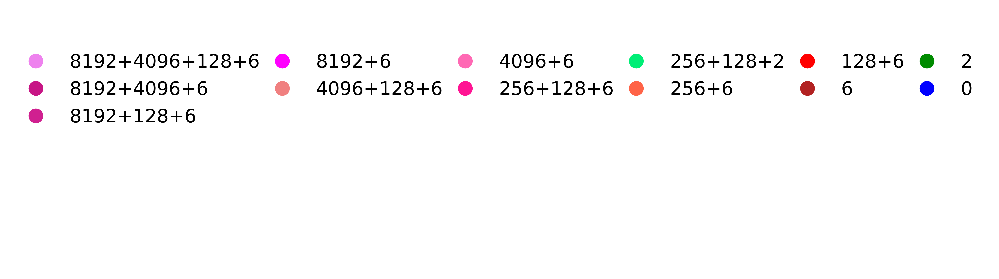

In [30]:
from matplotlib.lines import Line2D
fig = plt.figure(dpi = 600,figsize=(13,3.5))
ax = fig.add_subplot(111)
legend_ax = fig.add_axes([0.8, 0.2, 0.1, 0.6]) 

legend_ele = []  

for index in range(0,len(qual_MAD_index)):
    i = qual_MAD_index[index]
    print(i,qual_label[i])
    legend_ele.append(
        Line2D([0], [0], marker='o', color='none', markeredgecolor=hex_colors_ori[i],
               markerfacecolor=hex_colors_ori[i], markersize=10, label=qual_label[::-1][i])
    )

ax.axis('off')

legend_ax.axis('off')
legend_ax.legend(handles=legend_ele, loc='best',ncol=6, frameon=False,fontsize=14, columnspacing=0.2)
# plt.savefig('/work/a06/yingying/swot/plot/2_legend.jpg', format='jpg',dpi=600)
plt.show()
plt.close()


ValueError: The number of FixedLocator locations (11), usually from a call to set_ticks, does not match the number of labels (13).

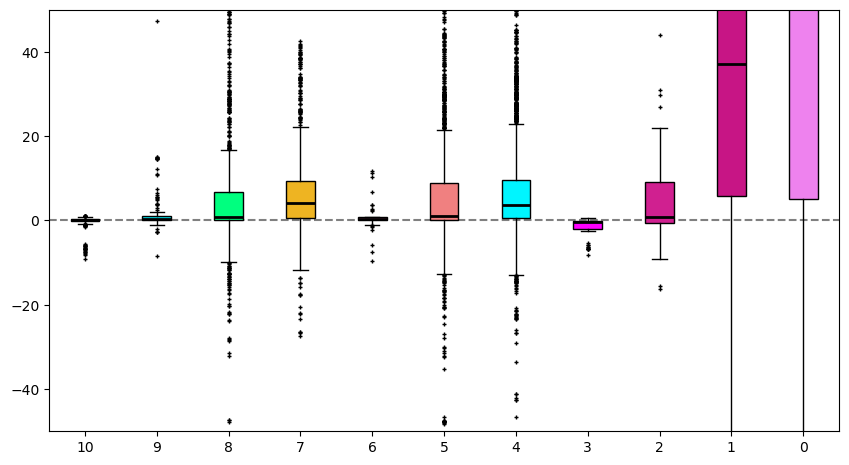

In [31]:
# Figure14: remake CDF of different quality flag
def plot_box(data,flag_plot,yrange,var):   
    # font_label = {'family': 'serif', 'weight': 'normal', 'size': 13.5}
    fig, ax = plt.subplots(figsize=(10, 6.2))
    ax.set_position([0.1, 0.3, 0.79, 0.68])
    flag_mean = np.full(np.shape(data)[0],np.nan)
    q1 = np.full(np.shape(data)[0],np.nan)
    q3 = np.full(np.shape(data)[0],np.nan)
    data = data[:, ~np.isnan(data).all(axis=0)]
    x = np.arange(0,np.shape(data)[1])
    x = x[::-1]
    ax.axhline(y=0,color='gray',linestyle='--',lw=1.5)
    for flag in range(0,np.shape(data)[1]):
        diff_each = np.delete(data[:,flag],np.where(np.isnan(data[:,flag])))
        q1[flag] = np.percentile(diff_each, 25)  # 25th percentile
        q3[flag] = np.percentile(diff_each, 75)  # 75th percentile
        flag_mean[flag] = np.median(diff_each)
        ax.boxplot(diff_each,positions=[x[flag]],widths=0.4,medianprops=dict(color='black', linewidth=2),flierprops=dict(marker='+', color='red', markersize=2.5,lw=2.5), patch_artist=True,boxprops=dict(facecolor=hex_colors[flag+1], linewidth=1))
        ax.set_ylim(-yrange,yrange)
    ax.set_xticks(x[::-1])
    ax.set_xticklabels(flag_plot,rotation=75,fontdict=font_label)
    ax.set_xlabel('quality flag',fontdict=font_title)
    ax.set_ylabel('SWOT$_{wse}$ - In-situ$_{wse}$ (m)',fontdict=font_title)
    plt.show()
    # plt.savefig('/work/a06/yingying/swot/plot/3_box_'+var+'.jpg', format='jpg',dpi=600)
    plt.close()
    
# plot absolute WSE
qual_label_filter = ['0','2','6','128+6','256+6','156+128+2','256+128+6','4096+6','4096+128+6','8192+6','8192+128+6','8192+4096+6','8192+4096+128+6']
plot_box(wse_adiff_point,qual_label_filter,50,'wse')



In [ ]:
# How many good measurements
## rmse
wse_all_rmse  = np.sqrt(np.nanmean(obs_wse-sat_wse)**2)
wse_MAD_rmse  = np.sqrt(np.nanmean(wse_diff_MAD**2))
wse_flag_rmse = np.sqrt(np.nanmean(wse_diff_flag**2))
print('all','{:.2f}'.format(wse_all_rmse),'MAD','{:.2f}'.format(wse_MAD_rmse),'flag','{:.2f}'.format(wse_flag_rmse))

## percentage of good measurements
#%% plot hist
def plot_hist(var_flat,var_flat0,var_flat1):
    fig,ax1 = plt.subplots(dpi=600,figsize=(10.5,5))
    sns.histplot(var_flat,bins=500,fill=True,color='red',ax=ax1)
    sns.histplot(var_flat0,bins=500,fill=True,color='blue',ax=ax1)
    sns.histplot(var_flat1,bins=500,fill=True,color='yellow',ax=ax1)
    ax1.set_xlabel('Sigma (dB)',fontdict=font_label)
    # ax1.legend(fontsize=18)
    ax1.set_xlim(0,20)
    ax1.tick_params(axis='x',labelsize=15)
    # ax2.legend(handles=[r_patch,b_patch],loc='upper right',frameon=True,fontsize=16)
    # plt.savefig('/work/a06/yingying/swot/plot/9_backscatter.jpg', format='jpg',dpi=600)
    plt.show()
# plot_hist(np.abs(obs_wse-sat_wse).flatten(),wse_diff_flag.flatten(),wse_diff_MAD.flatten())

def cal_data_range(data,range_value):
    data_all = np.shape(np.where(~np.isnan(data)))[1]
    data_good = np.shape(np.where(data<range_value))[1]
    ratio = data_good/data_all*100
    return ratio
rate_all = cal_data_range(np.abs(obs_wse-sat_wse).flatten(),0.5)
rate_flag= cal_data_range(wse_diff_flag.flatten(),0.5)
rate_MAD = cal_data_range(wse_diff_MAD.flatten(),0.5)
print('all','{:.2f}'.format(rate_all),'flag','{:.2f}'.format(rate_flag),'MAD','{:.2f}'.format(rate_MAD))
rate_flag6= cal_data_range(diff6_flag.flatten(),0.5)
rate_MAD6 = cal_data_range(diff6_MAD.flatten(),0.5)
print('flag','{:.2f}'.format(rate_flag6),'MAD','{:.2f}'.format(rate_MAD6))

fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,dpi=600,figsize=(12,5))
def plot_rate_bar(ax,category,data,ylabel,color,fontsize):
    wid = 0.4
    x = np.arange(len(category))
    ax.bar(x*0.75,data,color=color,width=wid,edgecolor='gray')
    ax.set_xticks(x*0.75)
    ax.set_xticklabels(category,fontdict=font_label)
    ax.set_ylabel(ylabel,fontsize=fontsize)
plot_rate_bar(ax1,['All data','Quality flag filter','MAD filter'],[rate_all,rate_flag,rate_MAD],'Percentage of data within 0.5m bias (%)',['red','blue','yellow'],14)
plot_rate_bar(ax2,['Quality flag 6 data','MAD filter'],[rate_flag6,rate_MAD6],'Percentage of quality flag 6 data within 0.5m bias (%)',['red','yellow'],10)
plt.savefig('/work/a06/yingying/swot/plot/14_ratio_good.jpg', format='jpg',dpi=600)
# plt.show()

fig,ax = plt.subplots(dpi=600,figsize=(5,5))
plot_rate_bar(ax,['All data','Quality flag filter'],[rate_all,rate_flag],'Percentage of data within 0.5m bias (%)',['red','blue'],14)
plt.savefig('/work/a06/yingying/swot/plot/14_ratio_qual.jpg', format='jpg',dpi=600)
# plt.show()
